In [1]:
import time
import numpy as np
import dxchange
from utils import nor_phase
from ganrec2 import GANphase
import os
from lib import visualize
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import tensorflow as tf
from ganrec1 import *
import skimage.io as io

# gpus = tf.config.experimental.list_physical_devices('GPU')
# if gpus:
#   # Restrict TensorFlow to only use the first GPU
#   try:
#     tf.config.experimental.set_visible_devices(gpus[1], 'GPU')
#     logical_gpus = tf.config.experimental.list_logical_devices('GPU')
#     print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
#   except RuntimeError as e:
#     # Visible devices must be set before GPUs have been initialized
#     print(e)



/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.3.0 and strictly below 2.6.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.9.3 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [104]:
import tensorflow as tf
from tensorflow_addons.image import median_filter2d

import numpy as np

from models import *
from utils import *

from joblib import Parallel, delayed


# @tf.function
def discriminator_loss(real_output, fake_output):
    real_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=real_output,
                                                                       labels=tf.ones_like(real_output)))
    fake_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_output,
                                                                       labels=tf.zeros_like(fake_output)))
    total_loss = real_loss + fake_loss
    return total_loss

def l1_loss(img1, img2):
    return tf.reduce_mean(tf.abs(img1 - img2))
def l2_loss(img1, img2):
    return tf.square(tf.reduce_mean(tf.abs(img1-img2)))

# @tf.function
def generator_loss(fake_output, img_output, pred, l1_ratio):
    gen_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_output,
                                                                      labels=tf.ones_like(fake_output))) \
               + l1_loss(img_output, pred) * l1_ratio
    return gen_loss

# @tf.function
def filer_loss(fake_output, img_output, img_filter):
    f_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_output,
                                                                    labels=tf.ones_like(fake_output))) + \
              l1_loss(img_output, img_filter) *10
              # l1_loss(img_output, img_filter) * 10
    return f_loss


def tfnor_tomo(img):
    img = tf.image.per_image_standardization(img)
    img = img / tf.reduce_max(img)
    img = img - tf.reduce_min(img)
    # img = (img - tf.reduce_min(img)) / (tf.reduce_max(img) - tf.reduce_min(img))
    return img


def tfnor_phase(img):
    img = tf.image.per_image_standardization(img)
    img = img / tf.reduce_max(img)
    return img

def tfnor_diff(img):
    # img = tf.image.per_image_standardization(img)
    # img = img / tf.reduce_max(img)
    # img = img - tf.reduce_min(img)
    img = (img - tf.reduce_min(img)) / (tf.reduce_max(img) - tf.reduce_min(img))
    return img

def avg_results(recon, loss):
    sort_index = np.argsort(loss)
    recon_tmp = recon[sort_index[:10], :, :, :]
    return np.mean(recon_tmp, axis=0)

def phase_fresnel(phase, absorption, ff, px):
    paddings = tf.constant([[px // 2, px // 2], [px // 2, px // 2]])
    # padding1 = tf.constant([[px // 2, px // 2], [0, 0]])
    # padding2 = tf.constant([[0, 0], [px // 2, px // 2]])
    pvalue = tf.reduce_mean(phase[:100, :])
    # phase = tf.pad(phase, paddings, 'CONSTANT',constant_values=1)
    phase = tf.pad(phase, paddings, 'SYMMETRIC')
    # phase = tf.pad(phase, paddings, 'REFLECT')
    absorption = tf.pad(absorption, paddings, 'SYMMETRIC')
    # phase = phase
    # absorption = absorption
    abfs = tf.complex(-absorption, phase)
    abfs = tf.exp(abfs)
    ifp = tf.abs(tf.signal.ifft2d(ff * tf.signal.fft2d(abfs))) ** 2
    ifp = tf.reshape(ifp, [ifp.shape[0], ifp.shape[1], 1])
    ifp = tf.image.central_crop(ifp, 0.5)
    ifp = tf.image.per_image_standardization(ifp)
    ifp = tf.reshape(ifp, [1, ifp.shape[0], ifp.shape[1], 1])
    # ifp = tfnor_phase(ifp)
    return ifp

def phase_fresnel_2(cosine, sine, absorption, ff, px):
    paddings = tf.constant([[px // 2, px // 2], [px // 2, px // 2]])
    # padding1 = tf.constant([[px // 2, px // 2], [0, 0]])
    # padding2 = tf.constant([[0, 0], [px // 2, px // 2]])
    pvalue = tf.reduce_mean(cosine[:100, :])
    # phase = tf.pad(phase, paddings, 'CONSTANT',constant_values=1)
    cosine = tf.pad(cosine, paddings, 'SYMMETRIC')
    sine = tf.pad(sine, paddings, 'SYMMETRIC')
    # phase = tf.pad(phase, paddings, 'REFLECT')
    absorption = tf.pad(absorption, paddings, 'SYMMETRIC')
    # abfs = #amplitude * (cosine - i * sine)
    abfs = tf.complex(tf.exp(-1*absorption) * cosine, tf.exp(-1*absorption)  * sine)
    # abfs = tf.complex(-absorption, phase)
    # abfs = tf.exp(abfs)
    ifp = tf.abs(tf.signal.ifft2d(ff * tf.signal.fft2d(abfs))) ** 2
    ifp = tf.reshape(ifp, [ifp.shape[0], ifp.shape[1], 1])
    ifp = tf.image.central_crop(ifp, 0.5)
    ifp = tf.image.per_image_standardization(ifp)
    ifp = tf.reshape(ifp, [1, ifp.shape[0], ifp.shape[1], 1])
    # ifp = tfnor_phase(ifp)
    return ifp

def phase_fraunhofer(phase, absorption):
    wf = tf.complex(absorption, phase)
    # wf = tf.complex(phase, absorption)

    # wf = mask_img(wf)
    # wf = tf.multiply(ampl, tf.exp(phshift))
    # wf = tf.manip.roll(wf, [160, 160], [0, 1])
    ifp = tf.square(tf.abs(tf.signal.fft2d(wf)))
 
    
    # # adding log to the fft
    # ifp = tf.math.log(ifp+8000)
    ifp = tf.math.log(ifp+10000)
    # ifp = tf.math.log(tf.abs(tf.signal.fft2d(wf))+1)
    # ifp = tf.math.log(tf.square(tf.abs(tf.signal.fft2d(wf)))+1)
    ifp = tf.signal.fftshift(ifp)
  
    # ifp = tf.roll(ifp, [256, 256], [0, 1])
    ifp = tf.reshape(ifp, [1, ifp.shape[0], ifp.shape[1], 1])
    ifp = tf.image.per_image_standardization(ifp)
    ifp = tfnor_diff(ifp)
    return ifp


def diffusion_layer(input_tensor, sigma=1.0):
    size = int(sigma*4)
    x = tf.linspace(-3.0, 3.0, size)
    z = (1.0/(sigma*tf.sqrt(2.0*3.1415)))*tf.exp(-tf.square(x)/(2.0*sigma*sigma))
    z_2d = tf.matmul(tf.reshape(z, [size, 1]), tf.reshape(z, [1, size]))
    z_4d = tf.reshape(z_2d, [size, size, 1, 1])
    return tf.nn.depthwise_conv2d(input_tensor, z_4d, [1, 1, 1, 1], 'SAME')

class GANphase:
    def __init__(self, i_input, energy, z, pv, **kwargs):
        phase_args = _get_GANphase_kwargs()
        phase_args.update(**kwargs)
        super(GANphase, self).__init__()
        self.i_input = i_input
        self.px, self.py = i_input.shape
        self.energy = energy
        self.z = z
        self.pv = pv
        self.internal_iter = kwargs['internal_iter']
        self.last_retrieval = kwargs['last_retrieval']
        self.iter_num = phase_args['iter_num']
        self.conv_num = phase_args['conv_num']
        self.conv_size = phase_args['conv_size']
        self.dropout = phase_args['dropout']
        self.l1_ratio = phase_args['l1_ratio']
        self.abs_ratio = phase_args['abs_ratio']
        self.g_learning_rate = phase_args['g_learning_rate']
        self.d_learning_rate = phase_args['d_learning_rate']
        self.phase_only = phase_args['phase_only']
        self.save_wpath = phase_args['save_wpath']
        self.init_wpath = phase_args['init_wpath']
        self.init_model = phase_args['init_model']
        self.save_model = phase_args['save_model']
        self.recon_monitor = phase_args['recon_monitor']
        self.filter_type = phase_args['filter_type']
        self.output_num = phase_args['output_num']
        self.filter = None
        self.generator = None
        self.discriminator = None
        self.filter_optimizer = None
        self.generator_optimizer = None
        self.discriminator_optimizer = None

    def make_model(self):
        self.filter = make_filter(self.i_input.shape[0],
                                  self.i_input.shape[1])
        self.generator = make_generator_atan(self.i_input.shape[0],
                                        self.i_input.shape[1],
                                        self.conv_num,
                                        self.conv_size,
                                        self.dropout,
                                        self.output_num)
        self.discriminator = make_discriminator(self.i_input.shape[0],
                                                self.i_input.shape[1])
        self.filter_optimizer = tf.keras.optimizers.Adam(5e-3)
        self.generator_optimizer = tf.keras.optimizers.Adam(self.g_learning_rate)
        self.discriminator_optimizer = tf.keras.optimizers.Adam(self.d_learning_rate)

    def make_chechpoints(self):
        checkpoint_dir = '/data/ganrec/training_checkpoints'
        checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
        checkpoint = tf.train.Checkpoint(generator_optimizer=self.generator_optimizer,
                                         discriminator_optimizer=self.discriminator_optimizer,
                                         generator=self.generator,
                                         discriminator=self.discriminator)

    @tf.function
    def rec_step(self, i_input, ff, phase_input = None, absorption_input = None):
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            recon = self.generator(i_input)
        
            #change from list to tensor
            if type(recon) == list:
                print(len(recon), recon[0].shape, recon[1].shape)
                sin_phase = recon[0][0, :, :, 0]
                cos_phase = recon[0][0, :, :, 1]
                
                phase = tf.reshape(tf.atan2(sin_phase, cos_phase), [1, self.px, self.py,1])
                absorption = (1 - tfnor_phase(tf.reshape(recon[1][0, :, :, 0], [1, self.px, self.py, 1])) )* self.abs_ratio
            
                phase = tf.reshape((phase), [self.px, self.py])
                absorption = tf.reshape((absorption), [self.px, self.py])
                # i_rec = phase_fresnel(phase, absorption, ff, self.px)
                i_rec = phase_fresnel_2(cos_phase, sin_phase, absorption, ff, self.px)
            else:   
                phase = tfnor_phase(tf.reshape(recon[:, :, :, 0], [1, self.px, self.py, 1]))
                absorption = (1 - tfnor_phase(tf.reshape(recon[:, :, :, 1], [1, self.px, self.py, 1])) )* self.abs_ratio
                phase = tf.reshape(phase, [self.px, self.py])
                absorption = tf.reshape((1- absorption) * self.abs_ratio, [self.px, self.py])
            
                if self.phase_only:
                    absorption = tf.zeros_like(phase)
                i_rec = phase_fresnel(phase, absorption, ff, self.px)
            # i_rec = phase_fresnel_2(tf.reshape((recon[:, :, :, 0]), [self.px, self.py]), tf.reshape((recon[:, :, :, 1]), [self.px, self.py]), tf.reshape(tfnor_phase(recon[:, :, :, 2]), [self.px, self.py]), ff, self.px)
        

            real_output = self.discriminator(i_input, training=True)
            fake_output = self.discriminator(i_rec, training=True)
            if phase_input is not None and absorption_input is not None:
                #change their shape
                phase_input = tf.reshape(phase_input, [1, self.px, self.py, 1])
                absorption_input = tf.reshape(absorption_input, [1, self.px, self.py, 1])
                phase = tf.reshape(phase, [1, self.px, self.py, 1])
                absorption = tf.reshape(absorption, [1, self.px, self.py, 1])
                #discremenate between the real phase and the generated phase, and the real absorption and the generated absorption and the real intensity and the generated intensity
                real_output_phase = self.discriminator(phase_input, training=True)
                fake_output_phase = self.discriminator(phase, training=True)
                real_output_abs = self.discriminator(absorption_input, training=True)
                fake_output_abs = self.discriminator(absorption, training=True)
                real_output_i = self.discriminator(i_input, training=True)
                fake_output_i = self.discriminator(i_rec, training=True)
                # fake_output_i_2 = self.discriminator(i_rec_2, training=True)

                g_loss = generator_loss(fake_output_i, i_input, i_rec, self.l1_ratio) + \
                            generator_loss(fake_output_phase, phase_input, phase, self.l1_ratio) + \
                            generator_loss(fake_output_abs, absorption_input, absorption, self.l1_ratio)
                            # generator_loss(fake_output_i_2, i_input, i_rec_2, self.l1_ratio)
                            
                
                d_loss = discriminator_loss(real_output, fake_output) + \
                        discriminator_loss(real_output_phase, fake_output_phase) + \
                            discriminator_loss(real_output_abs, fake_output_abs) + \
                            discriminator_loss(real_output_i, fake_output_i)
                                # discriminator_loss(real_output_i, fake_output_i_2)
                    
                
            else:
                g_loss = generator_loss(fake_output, i_input, i_rec, self.l1_ratio)
                d_loss = discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(g_loss,
                                                   self.generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(d_loss,
                                                        self.discriminator.trainable_variables)
        self.generator_optimizer.apply_gradients(zip(gradients_of_generator,
                                                     self.generator.trainable_variables))
        self.discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator,
                                                         self.discriminator.trainable_variables))
        


        return {'phase':  tf.reshape(phase, [self.px, self.py]),
                'absorption': tf.reshape(absorption, [self.px, self.py]),
                'i_rec': i_rec,
                'g_loss': g_loss,
                'd_loss': d_loss,
                'recon':recon}


    def multi_propagation(self, i_input, ffs, retrieved_phase = None, retrieved_absorption = None, filter_type = None):
        if retrieved_phase is not None and retrieved_absorption is not None:
            if filter_type is None:
                filter_type = self.filter_type

            if filter_type == 'median':
                # filter the phase and absorption
                filtered_phase = median_filter2d( tf.reshape(retrieved_phase, [1, self.px, self.py, 1]))[0, :, :, 0]
                filtered_absorption = median_filter2d( tf.reshape(retrieved_absorption, [1, self.px, self.py, 1]))[0, :, :, 0]
                step_results = [self.rec_step(phase_fresnel(filtered_phase, filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phase, absorption_input = filtered_absorption) for i in range(1, len(ffs))]
            if filter_type == 'contrast':
                # add contrast to the phase and absorption
                filtered_phase = (retrieved_phase - tf.reduce_min(retrieved_phase))/ (tf.reduce_max(retrieved_phase) - tf.reduce_min(retrieved_phase))
                filtered_absorption = (retrieved_absorption - tf.reduce_min(retrieved_absorption))/ (tf.reduce_max(retrieved_absorption) - tf.reduce_min(retrieved_absorption))
                step_results = [self.rec_step(phase_fresnel(filtered_phase, filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phase, absorption_input = filtered_absorption) for i in range(1, len(ffs))]
            
            if filter_type == 'noise':
                # add noise to the phase and absorption
                filtered_phase = retrieved_phase + tf.random.normal(retrieved_phase.shape, mean=0.0, stddev=0.1, dtype=tf.float32)
                filtered_absorption = retrieved_absorption + tf.random.normal(retrieved_absorption.shape, mean=0.0, stddev=0.1, dtype=tf.float32)
                step_results = [self.rec_step(phase_fresnel(filtered_phase, filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phase, absorption_input = filtered_absorption) for i in range(1, len(ffs))]
            if filter_type == 'diffuse':
                # diffuse
                # ffs = [ffs[0]]*5
                sigma_coeff = list(np.arange(0.9, 1.1, 0.2))
                ffs = [ffs[0]]*len(sigma_coeff)
                filtered_phases = [diffusion_layer(tf.reshape(retrieved_phase, [1, self.px, self.py, 1]), sigma=sigma_coeff[i])[0, :, :, 0] for i in range(len(sigma_coeff))]
                filtered_absorptions = [diffusion_layer(tf.reshape(retrieved_absorption, [1, self.px, self.py, 1]), sigma=sigma_coeff[i])[0, :, :, 0] for i in range(len(sigma_coeff))]
                step_results = [self.rec_step(phase_fresnel(filtered_phases[i], filtered_absorptions[i], ffs[0], self.px), ffs[0], phase_input = filtered_phases[i], absorption_input = filtered_absorptions[i]) for i in range(len(sigma_coeff))]
            if filter_type == 'phase_only':
                # diffuse
                sigma_coeff = list(np.arange(0.5, 0.5*len(ffs), 0.5))
                filtered_phases = [diffusion_layer(tf.reshape(retrieved_phase, [1, self.px, self.py, 1]), sigma=sigma_coeff[i])[0, :, :, 0] for i in range(len(sigma_coeff))]
                filtered_absorption = np.zeros_like(filtered_phases[0])
                step_results = [self.rec_step(phase_fresnel(filtered_phases[i], filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phases[i], absorption_input = filtered_absorption) for i in range(len(sigma_coeff))]
            if filter_type == 'alternate':
                step_results = [self.rec_step(phase_fresnel(retrieved_phase, retrieved_absorption, ffs[i], self.px), ffs[i], phase_input = retrieved_phase, absorption_input = retrieved_absorption) for i in range(1, len(ffs))]                
        else:
            step_results = self.rec_step(i_input, ffs[0])
        return step_results
    
    @property
    def recon(self):
        ff = ffactor(self.px * 2, self.py *2, self.energy, self.z, self.pv)
        ffs = []
        
        ffs.append(ff)
        # for i in range(1, self.internal_iter):
            # z_i = self.z * (1 + 1/i)
            # ffs.append(ffactor(self.px * 2, self.py *2, self.energy, z_i, self.pv))
        for i in range(1, self.internal_iter):
            z_i = self.z / (1 + 1/i)
            ffs.append(ffactor(self.px * 2, self.py *2, self.energy, z_i, self.pv))
        ffs.append(ff)
        # print(ff.shape, ff.max(), ff.min())

        i_input = np.reshape(self.i_input, (1, self.px, self.py, 1))
        i_input = tf.cast(i_input, dtype=tf.float32)
        self.make_model()

        if self.init_model:
            self.generator.load_weights(self.init_wpath+'generator.h5')
            print('generator is initilized')
            self.discriminator.load_weights(self.init_wpath+'discriminator.h5')
            print('discriminator is initilized')

        phase = np.zeros((self.iter_num, self.px, self.py))
        absorption = np.zeros((self.iter_num, self.px, self.py))
        gen_loss = np.zeros(self.iter_num)
        i_rec_all = np.zeros((self.iter_num, self.px, self.py))

        ###########################################################################
        # Reconstruction process monitor
        
        plot_x, plot_loss = [], []
        if self.recon_monitor:
            recon_monitor = RECONmonitor('phase')
            recon_monitor.initial_plot(self.i_input)

        side_propagation = []
        ###########################################################################
        for epoch in range(self.iter_num):

            ###########################################################################
            ## Call the rconstruction step
            
            step_results = self.rec_step(i_input, ffs[0])
            side_propagation.append(step_results['recon'])
            # side_propagation = list(tfnor_phase(tf.stack(side_propagation, axis = 0)))
            # print('epoch: {}, g_loss: {}, d_loss: {}'.format(epoch, step_results['g_loss'], step_results['d_loss']))

            if self.last_retrieval:
                if epoch % 100 == 0:
                    retrieved_phase = step_results['phase']
                    retrieved_absorption = step_results['absorption']
                    step_result_i = self.multi_propagation(i_input, ffs, retrieved_phase, retrieved_absorption, filter_type = self.filter_type)
                    # step_result_i = self.rec_step(median_filter2d(i_input), ff)    
                
            phase[epoch, :, :] = step_results['phase']
            absorption[epoch, :, :] = step_results['absorption']
            i_rec = step_results['i_rec']
            i_rec_all[epoch, :, :] = np.reshape(i_rec, (self.px, self.py))
            gen_loss[epoch] = step_results['g_loss']
            d_loss = step_results['d_loss']
            ###########################################################################
                
            plot_x.append(epoch)
            plot_loss = gen_loss[:epoch + 1]

            if (epoch + 1) % self.iter_num == 0:
                # checkpoint.save(file_prefix=checkpoint_prefix)
                if self.recon_monitor:  
                    i_rec = np.reshape(i_rec, (self.px, self.py))
                    i_diff = np.abs(i_rec - np.reshape(self.i_input, (self.px, self.py)))
                    phase_plt = np.reshape(phase[epoch], (self.px, self.py))
                    recon_monitor.update_plot(epoch, i_diff, phase_plt, plot_x, plot_loss)
        if self.recon_monitor:
            recon_monitor.close_plot()

        if self.save_model:
            self.generator.save(self.save_wpath+'generator.h5')
            self.discriminator.save(self.save_wpath+'discriminator.h5')

        return absorption[epoch], phase[epoch], i_rec_all[epoch], gen_loss, side_propagation

def train_one_image(data, **kwargs):
    import time
    import os
    import dxchange
    from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase
    abs_ratio = kwargs['abs_ratio']
    idx = kwargs['idx']

    assert type(data) is not list, 'data should be a list'
    gan_phase_object = GANphase(data, **kwargs)
    start = time.time()
    absorption, phase, i_rec_all, gen_loss, side_propagation = gan_phase_object.recon
    end = time.time()
    
    if 'save_wpath' not in kwargs.keys():
        save_wpath = None

    else:
        save_wpath = kwargs['save_wpath']
        
    if save_wpath is not None:
        #if path does not exist, create it
        if not os.path.exists(save_wpath):
            os.makedirs(save_wpath)
            os.makedirs(save_wpath+'/abs/')
            os.makedirs(save_wpath+'/phase/')
            os.makedirs(save_wpath+'/propagation/')
            os.makedirs(save_wpath+'/gen_loss/')

        dxchange.write_tiff(absorption, save_wpath+'abs/abs{}'.format(idx))
        dxchange.write_tiff(phase, save_wpath+'phase/phase_{}'.format(idx))
        dxchange.write_tiff(i_rec_all, save_wpath+'propagation/propagation{}'.format(idx))
        np.save(save_wpath+'gen_loss/gen_loss_{}'.format(idx), gen_loss)
        # np.save(save_wpath+'side_propagation/side_propagation_{}'.format(idx), side_propagation)
    matched = tfback_phase(tf_reshape(i_rec_all), tf_reshape(data))
    time_count = np.array([end-start])
    df = measure_reconstruction_quality(img1=tf_reshape(i_rec_all), img2 = tf_reshape(data), experiment_name = 'reconstructed'+str(idx)+'_'+str(abs_ratio), csv_file = 'Vojtech_fixed.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count[0], total_time = np.sum(time_count))
    return absorption, phase, i_rec_all, gen_loss, side_propagation


def train(data, **kwargs):
    import time
    import os
    import dxchange
    from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase

    if type(data) is not list:
        data = [data]
    n_items = len(data)
    px, py = data[0].shape
    kwargs['px'] = px
    kwargs['py'] = py

    iter_num = kwargs['iter_num']
    absorption = np.zeros((n_items, px, py))
    phase = np.zeros((n_items, px, py))
    i_rec_all = np.zeros((n_items, px, py))
    gen_loss = np.zeros((n_items, iter_num))
    side_propagations = []


    for i in range(n_items):
        if type(kwargs['z']) is list:
            args = kwargs.copy()
            args['z'] = args['z'][i]
            print(args['z'])
        else:
            args = kwargs.copy()
        absorption[i], phase[i], i_rec_all[i], gen_loss[i], side_propagation = train_one_image(data[i], **args)
        side_propagations.append(side_propagation)
    return absorption, phase, i_rec_all, gen_loss, side_propagations

def save_as_video(side_propagation, px, py, file_name = '10000_phases.mp4'):
    output_file = 'output_file.mp4'
    # Stack the images into a 4D tensor
    try:
        stacked_images = tf.reshape(tf.concat(side_propagation, axis=0)[:,:,:,0], [-1, px, py, 1])
    except:
        stacked_images = tf.reshape(tf.stack(side_propagation), [-1, px, py, 1])
    #make the image's bounded between 0 and 255
    stacked_images = (stacked_images - tf.reduce_min(stacked_images))/(tf.reduce_max(stacked_images) - tf.reduce_min(stacked_images)) * 255

    # Set the frame rate to 120 FPS
    fps = 120
    frame_interval = 1 / fps
    # Create the video writer
    writer = tf.io.TFRecordWriter(output_file)

    # Write the images to the video file
    for i in range(stacked_images.shape[0]):
        # Encode the image as a JPEG
        image_jpeg = tf.image.encode_jpeg(tf.cast(stacked_images[i], tf.uint8))
        mean = tf.reduce_mean(stacked_images[i])
        stddev = tf.math.reduce_std(stacked_images[i])
        # Create a video frame, while adding the mean and stddev to the frame
        video_frame = tf.train.SequenceExample(
            context=tf.train.Features(
                feature={
                    'image/encoded': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_jpeg.numpy()])),
                    'image/format': tf.train.Feature(bytes_list=tf.train.BytesList(value=[b'jpeg'])),
                    'mean': tf.train.Feature(float_list=tf.train.FloatList(value=[mean])),
                    'stddev': tf.train.Feature(float_list=tf.train.FloatList(value=[stddev]))
                }
            ),
            feature_lists=tf.train.FeatureLists(
                feature_list={
                    'image/encoded': tf.train.FeatureList(feature=[
                        tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_jpeg.numpy()]))
                    ])
                }
            )
        )
        writer.write(video_frame.SerializeToString())

        
        # Wait for the specified frame interval
        if i < stacked_images.shape[0] - 1:
            time.sleep(frame_interval)

    #converting to mp4
    import subprocess 
    subprocess.run(['ffmpeg', '-i', 'output_file.mp4', file_name])

    # Close the video writer
    writer.close()

def _get_GANphase_kwargs():
    return{
        'iter_num': 1000,
        'conv_num': 32,
        'conv_size': 3,
        'dropout': 0.25,
        'l1_ratio': 10,
        'abs_ratio': 0.05,
        'g_learning_rate': 1e-3,
        'd_learning_rate': 1e-5,
        'phase_only': False,
        'save_wpath': None,
        'init_wpath': None,
        'init_model': True,
        'save_model': False,
        'recon_monitor': True,
        'output_num': 2,
        'filter_type': 'median',
        'internal_iter': 3,
        'last_retrieval': False,
    }

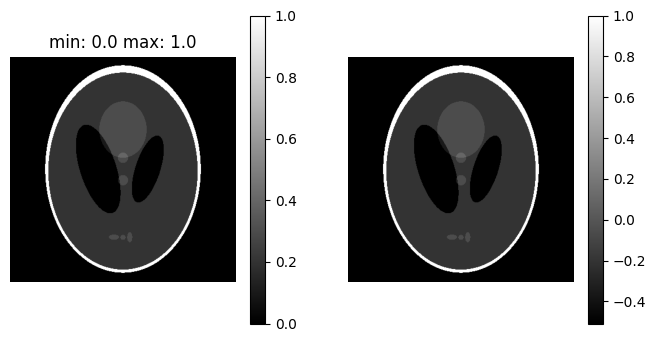

(400, 400) (512, 512)


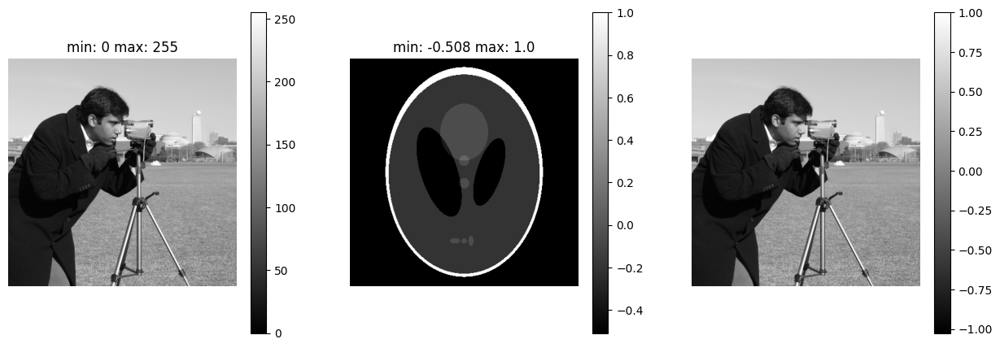

In [94]:
from skimage.data import shepp_logan_phantom, camera
shepp_logan_image = (1 - nor_phase(shepp_logan_phantom()))/(1 - np.max(nor_phase(shepp_logan_phantom())))
camera_image = nor_phase(camera())/np.max(nor_phase(camera()))
visualize([shepp_logan_phantom(), shepp_logan_image])
print(shepp_logan_image.shape, camera().shape)
visualize([camera(), shepp_logan_image, camera_image])


from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase
from skimage.transform import resize
import quantities as pq


energy = 30.8 * pq.keV
lam = wavelength_from_energy(energy)
fresnel_nummber = 0.005 * pq.dimensionless
z = 1.0 * pq.meter
pv = np.sqrt(fresnel_nummber * lam * z) #array(8.39314161e-06) * m

cameraman_tes_image =nor_phase(dxchange.read_tiff('data/cameraman.tif'))/np.max(nor_phase(dxchange.read_tiff('data/cameraman.tif')))
px, py = cameraman_tes_image.shape

kwargs = {
    'iter_num': 100,
    'internal_iter': 3,
    'last_retrieval': False,
    'save_wpath': None, #'data/gan_phase/cameraman/',
    'init_wpath': 'data/gan_phase/cameraman/',
    'init_model': False,
    'save_model': False,
    'filter_type': 'median', #chose from median, contrast, noise, diffuse, phase_only, alternate
    'output_num': 2,
    'phase_only': False,
    'recon_monitor': True,
}

kwargs.update({
    'energy': energy.magnitude,
    'z': z.magnitude,
    'pv': pv.magnitude,
    'idx': 0,
    'abs_ratio': 0.1,
    'px': px,
    'py': py,
})


given_phase = cameraman_tes_image
cos, sin = np.cos(given_phase), np.sin(given_phase)
given_absorption = (1 - shepp_logan_image) * kwargs['abs_ratio']
given_absorption = resize(given_absorption, (px, py))

different_distances = list(np.arange(0, 3.1, 0.01))
ffs = [ffactor(px * 2, py *2, kwargs['energy'], distance, kwargs['pv']) for distance in different_distances]
ff = ffactor(px * 2, py *2, kwargs['energy'], kwargs['z'], kwargs['pv'])

propagated_image = nor_phase(phase_fresnel(given_phase, given_absorption, ff, px)[0, :, :, 0])
propagated_images = [nor_phase(phase_fresnel(given_phase, given_absorption, ffs[i], px)[0, :, :, 0]) for i in range(len(ffs))]



In [105]:
save_as_video(propagated_images, px, py, file_name = 'propagation_shepp_camera.mp4')

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

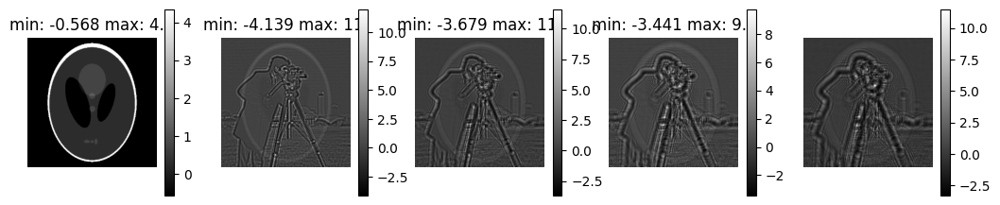

{'iter_num': 1000, 'internal_iter': 3, 'last_retrieval': False, 'save_wpath': 'data/gan_phase/cameraman/', 'init_wpath': 'data/gan_phase/cameraman/', 'init_model': True, 'save_model': True, 'filter_type': 'median', 'output_num': 2, 'phase_only': False, 'recon_monitor': True, 'energy': array(30.8), 'z': [1e-05, 0.10001, 0.20001000000000002, 0.30001000000000005, 0.40001000000000003, 0.50001, 0.60001, 0.70001, 0.80001, 0.90001, 1.00001], 'pv': array(4.4863229e-07), 'idx': 0, 'abs_ratio': 0.1, 'px': 256, 'py': 256}
1e-05
generator is initilized
discriminator is initilized


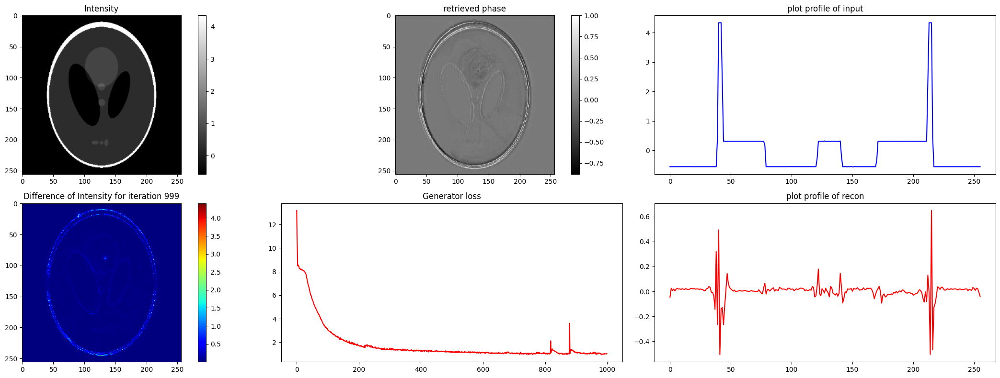

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                              0.000571
sum of absolute value of pointwise difference            8.304049
sum of squared difference                                3.990406
PSNR                                                  [18.072227]
SSIM                                                 [0.94345295]
NRMSE                                                      1.9976
MSSIM                                                [0.98821545]
epoch_time                                              28.934551
total_time                                              28.934551
0.10001
generator is initilized
discriminator is initilized


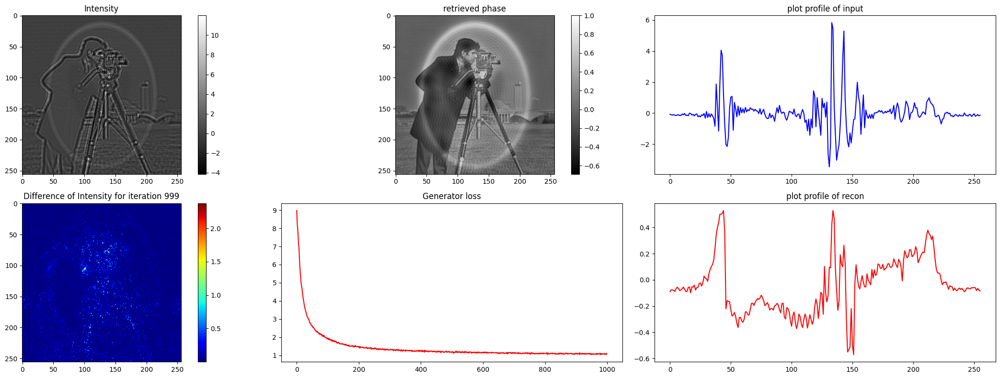

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                              0.000003
sum of absolute value of pointwise difference            9.685316
sum of squared difference                                 2.61663
PSNR                                                  [19.904976]
SSIM                                                 [0.94936526]
NRMSE                                                      1.6176
MSSIM                                                [0.97518206]
epoch_time                                              28.879546
total_time                                              28.879546
0.20001000000000002
generator is initilized
discriminator is initilized


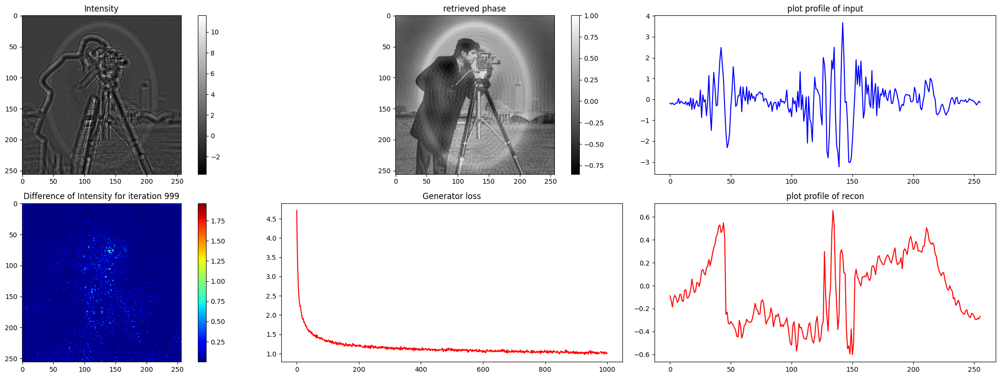

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                             -0.000029
sum of absolute value of pointwise difference             8.20775
sum of squared difference                                1.802177
PSNR                                                  [21.524424]
SSIM                                                  [0.9606286]
NRMSE                                                    1.342452
MSSIM                                                [0.97138757]
epoch_time                                              27.922369
total_time                                              27.922369
0.30001000000000005
generator is initilized
discriminator is initilized


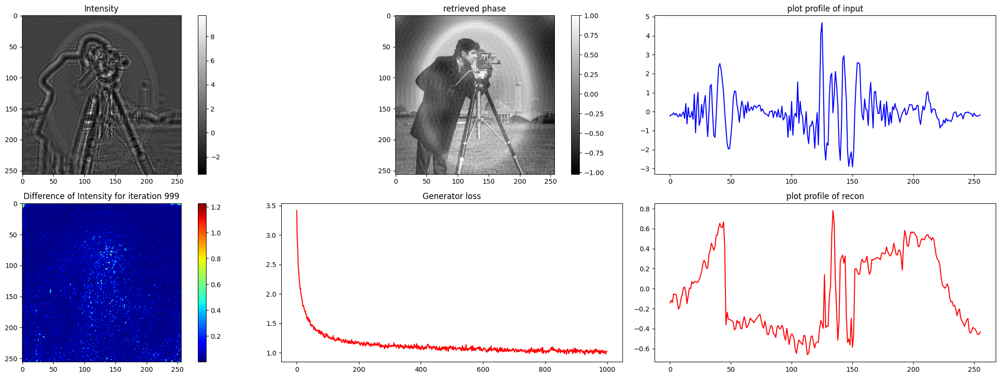

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                             -0.000003
sum of absolute value of pointwise difference             8.30238
sum of squared difference                                1.442577
PSNR                                                  [22.491009]
SSIM                                                  [0.9583077]
NRMSE                                                    1.201073
MSSIM                                                 [0.9682726]
epoch_time                                              27.395422
total_time                                              27.395422
0.40001000000000003
generator is initilized
discriminator is initilized


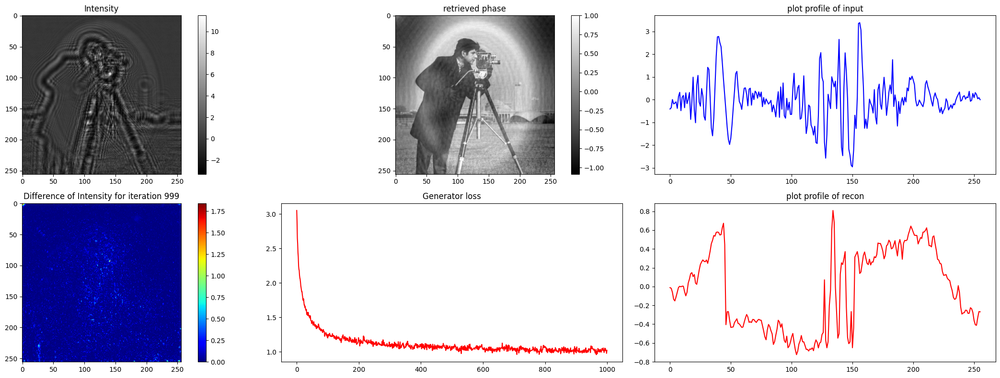

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                               0.00005
sum of absolute value of pointwise difference            8.135902
sum of squared difference                                1.291945
PSNR                                                   [22.96996]
SSIM                                                  [0.9634029]
NRMSE                                                    1.136637
MSSIM                                                [0.97013146]
epoch_time                                              30.732932
total_time                                              30.732932
0.50001
generator is initilized
discriminator is initilized


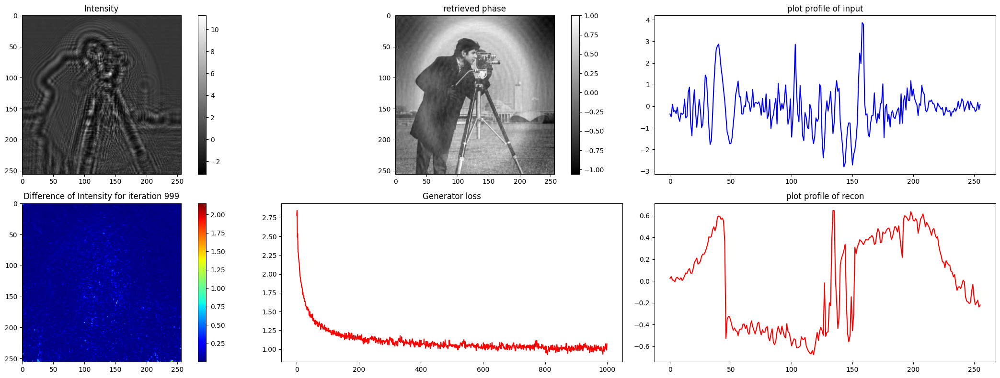

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                             -0.000032
sum of absolute value of pointwise difference            8.735623
sum of squared difference                                1.247931
PSNR                                                  [23.120495]
SSIM                                                  [0.9681417]
NRMSE                                                    1.117108
MSSIM                                                 [0.9860459]
epoch_time                                              29.419307
total_time                                              29.419307
0.60001
generator is initilized
discriminator is initilized


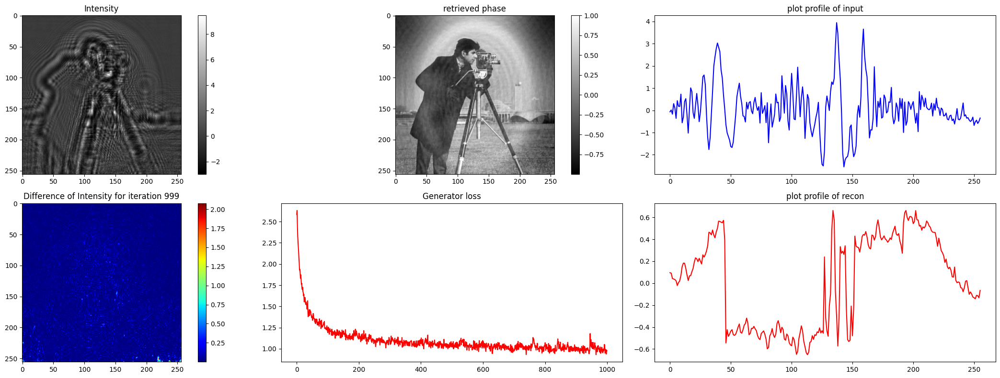

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                             -0.000015
sum of absolute value of pointwise difference            7.437694
sum of squared difference                                1.077974
PSNR                                                  [23.756317]
SSIM                                                  [0.9724052]
NRMSE                                                    1.038255
MSSIM                                                 [0.9899198]
epoch_time                                              30.671039
total_time                                              30.671039
0.70001
generator is initilized
discriminator is initilized


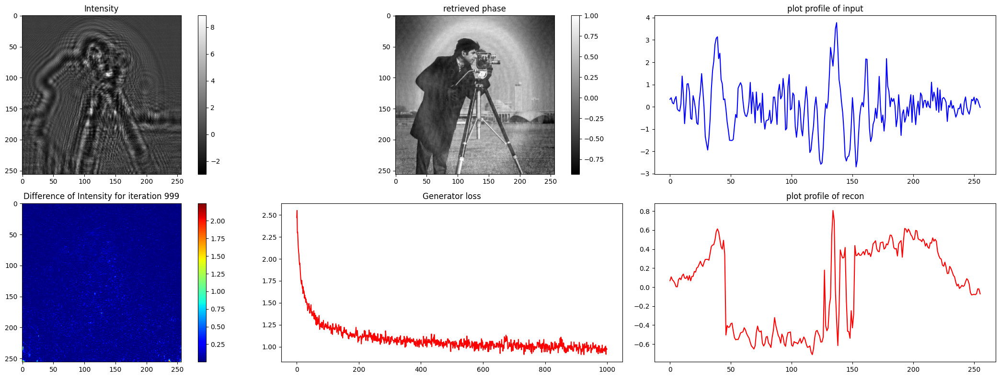

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                              0.000043
sum of absolute value of pointwise difference            7.301354
sum of squared difference                                1.014248
PSNR                                                  [24.020958]
SSIM                                                 [0.97430515]
NRMSE                                                    1.007099
MSSIM                                                 [0.9913119]
epoch_time                                              26.445777
total_time                                              26.445777
0.80001
generator is initilized
discriminator is initilized


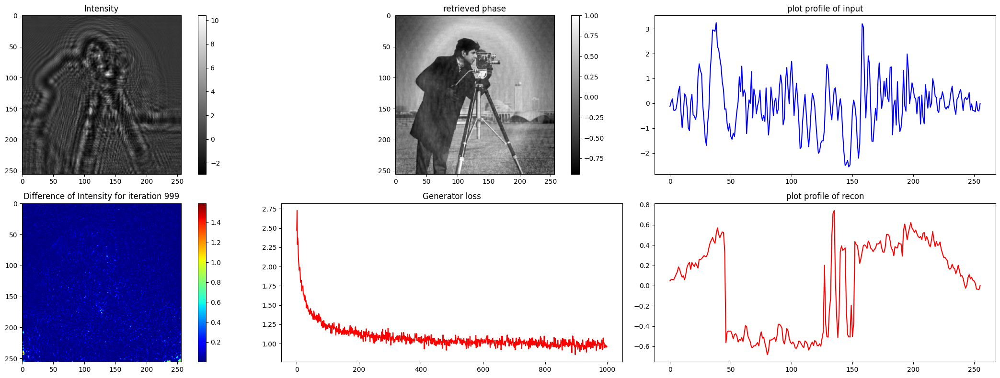

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                             -0.000051
sum of absolute value of pointwise difference             7.28657
sum of squared difference                                 0.97583
PSNR                                                  [24.188658]
SSIM                                                 [0.97651607]
NRMSE                                                    0.987841
MSSIM                                                 [0.9960501]
epoch_time                                              29.566108
total_time                                              29.566108
0.90001
generator is initilized
discriminator is initilized


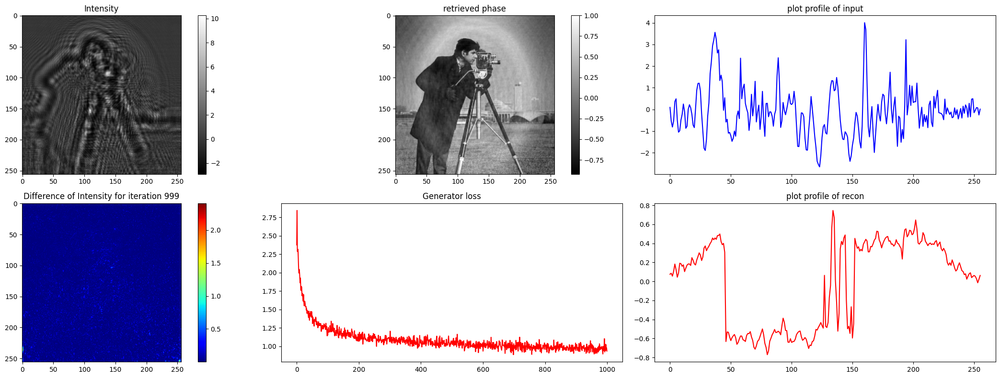

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                              0.000015
sum of absolute value of pointwise difference            7.091342
sum of squared difference                                0.955149
PSNR                                                  [24.281687]
SSIM                                                  [0.9782114]
NRMSE                                                    0.977317
MSSIM                                                [0.99754125]
epoch_time                                              29.368955
total_time                                              29.368955
1.00001
generator is initilized
discriminator is initilized


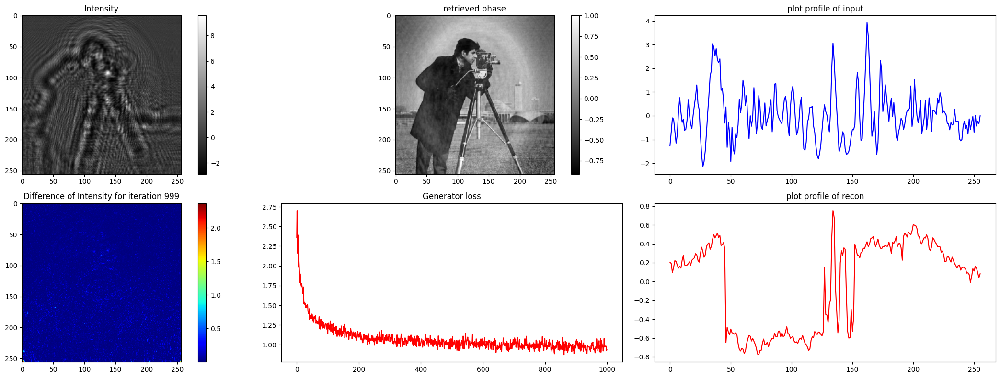

                                                                0
experiment_name                                reconstructed0_0.1
iter                                                         1000
sum of pointwise difference                             -0.000029
sum of absolute value of pointwise difference            7.151582
sum of squared difference                                0.896524
PSNR                                                  [24.556778]
SSIM                                                 [0.97884244]
NRMSE                                                     0.94685
MSSIM                                                  [0.998158]
epoch_time                                              30.588448
total_time                                              30.588448


In [90]:
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase
from skimage.transform import resize
import quantities as pq


energy = 30.8 * pq.keV
lam = wavelength_from_energy(energy)
fresnel_nummber = 0.005 * pq.dimensionless
z = 1.0 * pq.meter
pv = np.sqrt(fresnel_nummber * lam * z) #array(8.39314161e-06) * m

cameraman_tes_image =nor_phase(dxchange.read_tiff('data/cameraman.tif'))/np.max(nor_phase(dxchange.read_tiff('data/cameraman.tif')))
px, py = cameraman_tes_image.shape

kwargs = {
    'iter_num': 100,
    'internal_iter': 3,
    'last_retrieval': False,
    'save_wpath': None, #'data/gan_phase/cameraman/',
    'init_wpath': 'data/gan_phase/cameraman/',
    'init_model': False,
    'save_model': False,
    'filter_type': 'median', #chose from median, contrast, noise, diffuse, phase_only, alternate
    'output_num': 2,
    'phase_only': False,
    'recon_monitor': True,
}

kwargs.update({
    'energy': energy.magnitude,
    'z': z.magnitude,
    'pv': pv.magnitude,
    'idx': 0,
    'abs_ratio': 0.1,
    'px': px,
    'py': py,
})


given_phase = cameraman_tes_image
cos, sin = np.cos(given_phase), np.sin(given_phase)
given_absorption = (1 - shepp_logan_image) * kwargs['abs_ratio']
given_absorption = resize(given_absorption, (px, py))

different_distances = list(np.arange(0.00001, 1.1, 0.1))
ffs = [ffactor(px * 2, py *2, kwargs['energy'], distance, kwargs['pv']) for distance in different_distances]
ff = ffactor(px * 2, py *2, kwargs['energy'], kwargs['z'], kwargs['pv'])

propagated_image = nor_phase(phase_fresnel(given_phase, given_absorption, ff, px)[0, :, :, 0])
propagated_images = [nor_phase(phase_fresnel(given_phase, given_absorption, ffs[i], px)[0, :, :, 0]) for i in range(len(ffs))]

visualize(propagated_images)
kwargs.update({
    'z': different_distances,
    'iter_num': 1000,
    'save_wpath': 'data/gan_phase/cameraman/',
    'init_wpath': 'data/gan_phase/cameraman/',
    'init_model': True,
    'save_model': True,
})
print(kwargs)

absorption, phase, i_rec_all, gen_loss, side_propagations = train(propagated_images, **kwargs)

In [91]:
[save_as_video(side_propagations[i], file_name = 'cameraman_with_shepp_{}.mp4'.format(i)) for i in range(len(side_propagations))]


(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

(1000, 256, 256, 1)


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

[None, None, None, None, None, None, None, None, None, None, None]

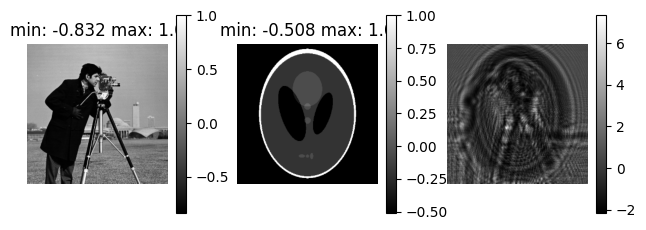

generator is initilized
discriminator is initilized


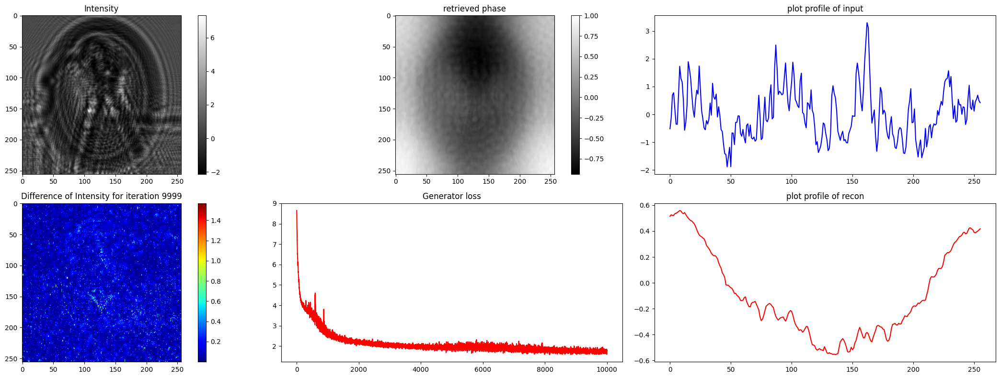

ValueError: setting an array element with a sequence.

In [92]:
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase
from skimage.transform import resize
import quantities as pq


energy = 30.8 * pq.keV
lam = wavelength_from_energy(energy)
fresnel_nummber = 0.005 * pq.dimensionless
z = 1.0 * pq.meter
pv = np.sqrt(fresnel_nummber * lam * z) #array(8.39314161e-06) * m

cameraman_tes_image =nor_phase(dxchange.read_tiff('data/cameraman.tif'))/np.max(nor_phase(dxchange.read_tiff('data/cameraman.tif')))
px, py = cameraman_tes_image.shape
kwargs = {
    'iter_num': 10000,
    'internal_iter': 3,
    'last_retrieval': False,
    'save_wpath': 'data/gan_phase/cameraman/',
    'init_wpath': 'data/gan_phase/cameraman/',
    'init_model': True,
    'save_model': False,
    'filter_type': 'median', #chose from median, contrast, noise, diffuse, phase_only, alternate
    'output_num': 2,
    'energy': energy.magnitude,
    'z': z.magnitude,
    'pv': pv.magnitude,
    'phase_only': True,
    'recon_monitor': True,
    'abs_ratio': 0,
    'dropout': 0.25,
    'idx': 0
}

abs_ratio_all = 1 * np.ones(1)
absorption = np.zeros((len(abs_ratio_all), px, py))
phase = np.zeros((len(abs_ratio_all), px, py))
propagated = np.zeros((len(abs_ratio_all), px, py))
loss = np.zeros(len(abs_ratio_all))
side_propagations = []
time_count = np.zeros(len(abs_ratio_all))


for i, abs_ratio in enumerate(abs_ratio_all):
    given_phase = cameraman_tes_image
    cos, sin = np.cos(given_phase), np.sin(given_phase)
    given_absorption = shepp_logan_image * abs_ratio
    given_absorption = resize(given_absorption, (px, py))

    ff = ffactor(px * 2, py *2, kwargs['energy'], kwargs['z'], kwargs['pv'])
    propagated_image = nor_phase(phase_fresnel(given_phase, given_absorption, ff, px)[0, :, :, 0])

    # #propagation with cos and sin
    # propagated_image = phase_fresnel_2(cos, sin, given_absorption, ff, px)[0, :, :, 0]
    visualize([cameraman_tes_image, given_absorption, propagated_image])
    idx = i
    gan_phase_object = GANphase(propagated_image, **kwargs)
    start = time.time()
    absorption[i], phase[i],propagated[i], loss[i], side_propagation  = gan_phase_object.recon
    side_propagations.append(side_propagation)
    end = time.time()
    time_count[i] = end - start
    # matched = tfback_phase( propagated[i], cameraman_tes_image[idx])
    visualize([absorption[i], phase[i], propagated[i]])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/phase/phase_'+str(idx)+'_'+str(abs_ratio)+'.tif', phase[i])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/abs/abs_'+str(idx)+'_'+str(abs_ratio)+'.tif', absorption[i])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/propagated/propagated_'+str(idx)+'_'+str(abs_ratio)+'.tif', propagated[i])
    df = measure_reconstruction_quality(img1=tf_reshape(propagated[i]), img2 = tf_reshape(propagated_image), experiment_name = 'spider_hair_'+str(idx)+'_'+str(abs_ratio), csv_file = 'Vojtech_fixed.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count[0], total_time = np.sum(time_count))
    display(df)

#using pandas, analyze the mean, std, min, max of the side propagation
import pandas as pd
analysis = pd.DataFrame({'experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phasee', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'})

for i in range(len(side_propagations)):
    for iter in range(len(side_propagations[0])):
        #fill the values in the dataframe
        new_pd = pd.DataFrame(columns=['experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phase', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'])
        new_pd['experiment'] = [i]
        new_pd['iteration'] = [iter]
        new_pd['mean_phase'] = [np.mean(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['std_phase'] = [np.std(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['min_phase'] = [np.min(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['max_phase'] = [np.max(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['mean_abs'] = [np.mean(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['std_abs'] = [np.std(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['min_abs'] = [np.min(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['max_abs'] = [np.max(side_propagations[i][iter][0,:,:,1].numpy())]
        analysis = pd.concat([analysis, new_pd], axis=0)
analysis.drop(analysis.columns[0], axis=1, inplace=True)
analysis.dropna(inplace=True)
analysis.to_csv('data/gan_phase/spider_abs_ratio/analysis.csv')

#graph the mean, std, min, max of the side propagation
import matplotlib.pyplot as plt
plt.figure()
plt.plot(analysis['iteration'], analysis['mean_phase'], label='mean_phase')
plt.plot(analysis['iteration'], analysis['std_phase'], label='std_phase')
plt.plot(analysis['iteration'], analysis['min_phase'], label='min_phase')
plt.plot(analysis['iteration'], analysis['max_phase'], label='max_phase')
plt.legend()
plt.savefig('data/gan_phase/spider_abs_ratio/phase_analysis.png')


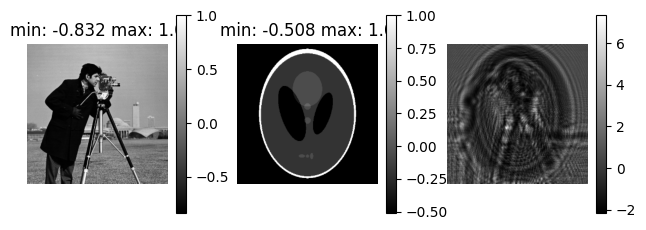

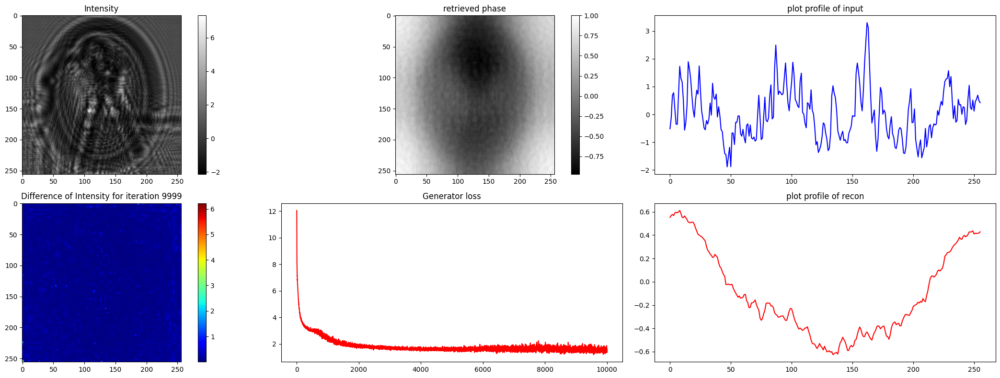

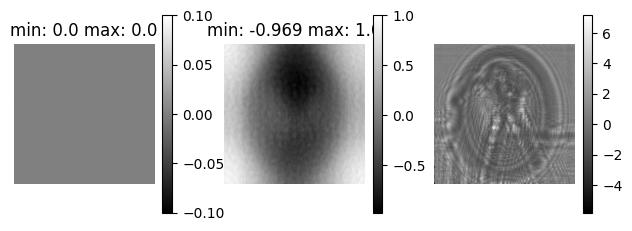

                                                               0
experiment_name                                spider_hair_0_1.0
iter                                                       10000
sum of pointwise difference                            -0.000861
sum of absolute value of pointwise difference          21.133583
sum of squared difference                               5.838398
PSNR                                                 [16.419462]
SSIM                                                [0.92821413]
NRMSE                                                   2.416278
MSSIM                                               [0.98479867]
epoch_time                                            212.369425
total_time                                            212.369425


,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,0.2805,0.2806,0.2807,0.2808,0.2809,0.2810,0.2811,0.2812,0.2813,0
experiment_name,spider_hair_0_0.005,spider_hair_0_0.001,spider_hair_0_0.01,spider_hair_0_0.1,spider_hair_0_0.005,spider_hair_1_0.005,spider_hair_2_0.005,spider_hair_3_0.005,spider_hair_4_0.005,spider_hair_5_0.005,...,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.001,spider_hair_0_0.1,spider_hair_0_1.0,spider_hair_0_1.0,spider_hair_0_1.0
iter,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,100,1000,1000,3000,3000,3000,1000,1000,1000,10000
sum of pointwise difference,1.0678117,1.0677754,1.0677476,1.0681081,1.0675116,1.7406926,5.294111,4.6951256,-2.0370803,-0.76821685,...,-4.887581e-06,0.00030565262,-0.000308007,0.0003016293,-4.4703484e-05,2.9444695e-05,3.6478043e-05,9.524822e-05,0.0005182028,-0.000861
sum of absolute value of pointwise difference,27.055195,26.410727,19.84621,17.291338,17.791815,33.992867,31.49842,31.038956,31.634548,33.0773,...,95.84966,52.070328,36.24582,22.688759,23.920897,40.089428,16.804554,38.477856,44.271748,21.133583
sum of squared difference,5.6280355,5.884934,3.3873558,2.4756074,2.4831715,9.0479965,7.518339,7.4791965,8.405365,9.745775,...,100.99045,26.714602,14.368202,8.143107,7.5046263,33.676437,3.2737184,20.976555,20.881142,5.838398
PSNR,[19.58913],[19.395283],[21.794092],[23.155882],[23.142632],[17.527176],[18.331478],[18.354149],[17.847134],[17.204535],...,[4.0395966],[9.814912],[12.508375],[14.974498],[15.329108],[8.809137],[18.931986],[10.865058],[10.884856],[16.419462]
SSIM,[0.89393246],[0.842487],[0.93475425],[0.9483144],[0.93816346],[0.735249],[0.80681175],[0.85031],[0.8700472],[0.8572213],...,[0.5411447],[0.75469446],[0.83106005],[0.900737],[0.8944077],[0.6310538],[0.85199547],[0.78253055],[0.7866998],[0.92821413]
NRMSE,2.372348,2.4258883,1.840477,1.5734063,1.5758082,3.0079887,2.7419589,2.734812,2.8992007,3.1218224,...,10.0494,5.168617,3.7905412,2.853613,2.7394571,5.80314,1.8093419,4.580017,4.5695887,2.416278
MSSIM,[0.98695135],[0.9543729],[0.9928939],[0.9946718],[0.99315494],[0.8924219],[0.9378776],[0.97340477],[0.97980803],[0.97619706],...,[0.],[0.86806476],[0.94152194],[0.97730225],[0.9739463],[0.9188439],[0.9653022],[0.9034648],[0.8525488],[0.98479867]
epoch_time,[77.765144],[61.675625],[57.26491],[61.144947],[80.770164],[80.770164],[80.770164],[80.770164],[80.770164],[80.770164],...,9.185746431350708,28.433402061462402,27.422891855239868,69.54185962677002,68.74588966369629,69.92744278907776,29.375951766967773,28.78313374519348,27.31140422821045,212.369425


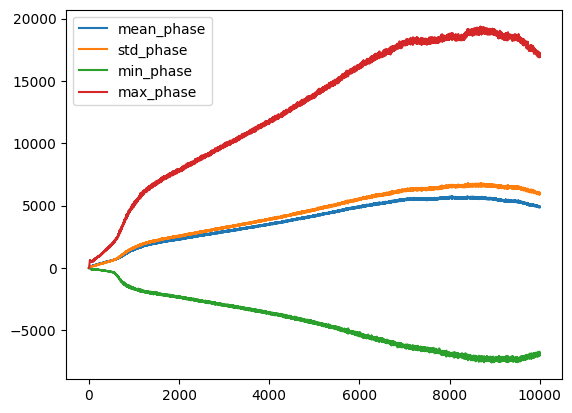

In [29]:
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase
from skimage.transform import resize
import quantities as pq


energy = 30.8 * pq.keV
lam = wavelength_from_energy(energy)
fresnel_nummber = 0.005 * pq.dimensionless
z = 1.0 * pq.meter
pv = np.sqrt(fresnel_nummber * lam * z) #array(8.39314161e-06) * m

cameraman_tes_image =nor_phase(dxchange.read_tiff('data/cameraman.tif'))/np.max(nor_phase(dxchange.read_tiff('data/cameraman.tif')))
px, py = cameraman_tes_image.shape
kwargs = {
    'iter_num': 10000,
    'internal_iter': 3,
    'last_retrieval': False,
    'save_wpath': 'data/gan_phase/cameraman/',
    'init_wpath': 'data/gan_phase/cameraman/',
    'init_model': True,
    'save_model': False,
    'filter_type': 'median', #chose from median, contrast, noise, diffuse, phase_only, alternate
    'output_num': 2,
    'energy': energy.magnitude,
    'z': z.magnitude,
    'pv': pv.magnitude,
    'phase_only': True,
    'recon_monitor': True,
    'abs_ratio': 0,
    'dropout': 0.25,
    'idx': 0
}

abs_ratio_all = 1 * np.ones(1)
absorption = np.zeros((len(abs_ratio_all), px, py))
phase = np.zeros((len(abs_ratio_all), px, py))
propagated = np.zeros((len(abs_ratio_all), px, py))
loss = np.zeros(len(abs_ratio_all))
side_propagations = []
time_count = np.zeros(len(abs_ratio_all))


for i, abs_ratio in enumerate(abs_ratio_all):
    given_phase = cameraman_tes_image
    cos, sin = np.cos(given_phase), np.sin(given_phase)
    given_absorption = shepp_logan_image * abs_ratio
    given_absorption = resize(given_absorption, (px, py))

    ff = ffactor(px * 2, py *2, kwargs['energy'], kwargs['z'], kwargs['pv'])
    propagated_image = nor_phase(phase_fresnel(given_phase, given_absorption, ff, px)[0, :, :, 0])

    # #propagation with cos and sin
    # propagated_image = phase_fresnel_2(cos, sin, given_absorption, ff, px)[0, :, :, 0]
    visualize([cameraman_tes_image, given_absorption, propagated_image])
    idx = i
    gan_phase_object = GANphase(propagated_image, **kwargs)
    start = time.time()
    absorption[i], phase[i],propagated[i], loss[i], side_propagation  = gan_phase_object.recon
    side_propagations.append(side_propagation)
    end = time.time()
    time_count[i] = end - start
    # matched = tfback_phase( propagated[i], cameraman_tes_image[idx])
    visualize([absorption[i], phase[i], propagated[i]])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/phase/phase_'+str(idx)+'_'+str(abs_ratio)+'.tif', phase[i])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/abs/abs_'+str(idx)+'_'+str(abs_ratio)+'.tif', absorption[i])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/propagated/propagated_'+str(idx)+'_'+str(abs_ratio)+'.tif', propagated[i])
    df = measure_reconstruction_quality(img1=tf_reshape(propagated[i]), img2 = tf_reshape(propagated_image), experiment_name = 'spider_hair_'+str(idx)+'_'+str(abs_ratio), csv_file = 'Vojtech_fixed.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count[0], total_time = np.sum(time_count))
    display(df)

#using pandas, analyze the mean, std, min, max of the side propagation
import pandas as pd
analysis = pd.DataFrame({'experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phasee', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'})

for i in range(len(side_propagations)):
    for iter in range(len(side_propagations[0])):
        #fill the values in the dataframe
        new_pd = pd.DataFrame(columns=['experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phase', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'])
        new_pd['experiment'] = [i]
        new_pd['iteration'] = [iter]
        new_pd['mean_phase'] = [np.mean(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['std_phase'] = [np.std(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['min_phase'] = [np.min(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['max_phase'] = [np.max(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['mean_abs'] = [np.mean(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['std_abs'] = [np.std(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['min_abs'] = [np.min(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['max_abs'] = [np.max(side_propagations[i][iter][0,:,:,1].numpy())]
        analysis = pd.concat([analysis, new_pd], axis=0)
analysis.drop(analysis.columns[0], axis=1, inplace=True)
analysis.dropna(inplace=True)
analysis.to_csv('data/gan_phase/spider_abs_ratio/analysis.csv')

#graph the mean, std, min, max of the side propagation
import matplotlib.pyplot as plt
plt.figure()
plt.plot(analysis['iteration'], analysis['mean_phase'], label='mean_phase')
plt.plot(analysis['iteration'], analysis['std_phase'], label='std_phase')
plt.plot(analysis['iteration'], analysis['min_phase'], label='min_phase')
plt.plot(analysis['iteration'], analysis['max_phase'], label='max_phase')
plt.legend()
plt.savefig('data/gan_phase/spider_abs_ratio/phase_analysis.png')


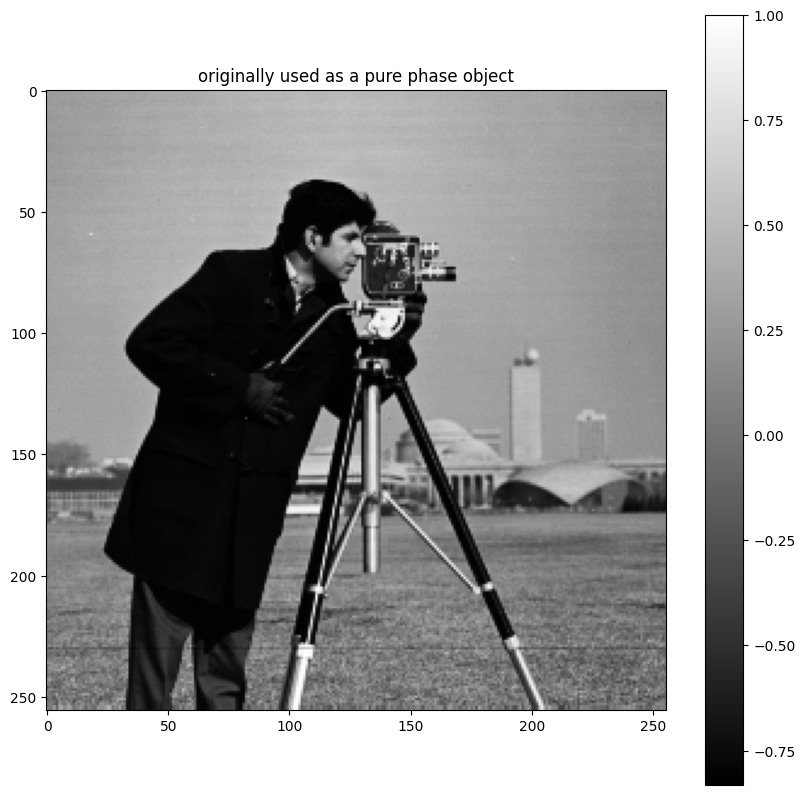

In [5]:
plot_or_show_images([cameraman_tes_image], title = 'originally used as a pure phase object', show_or_plot = 'show')

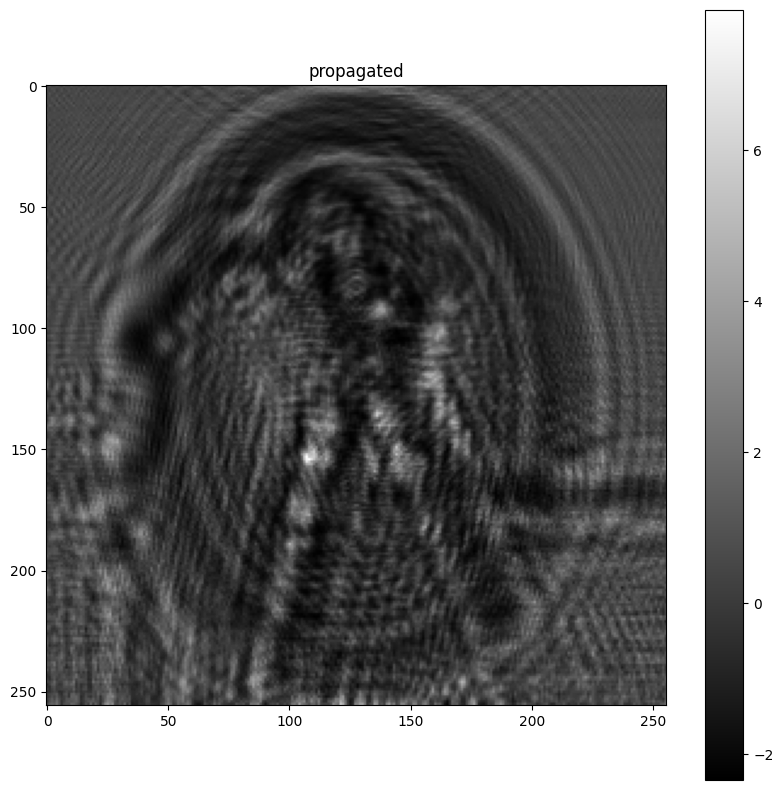

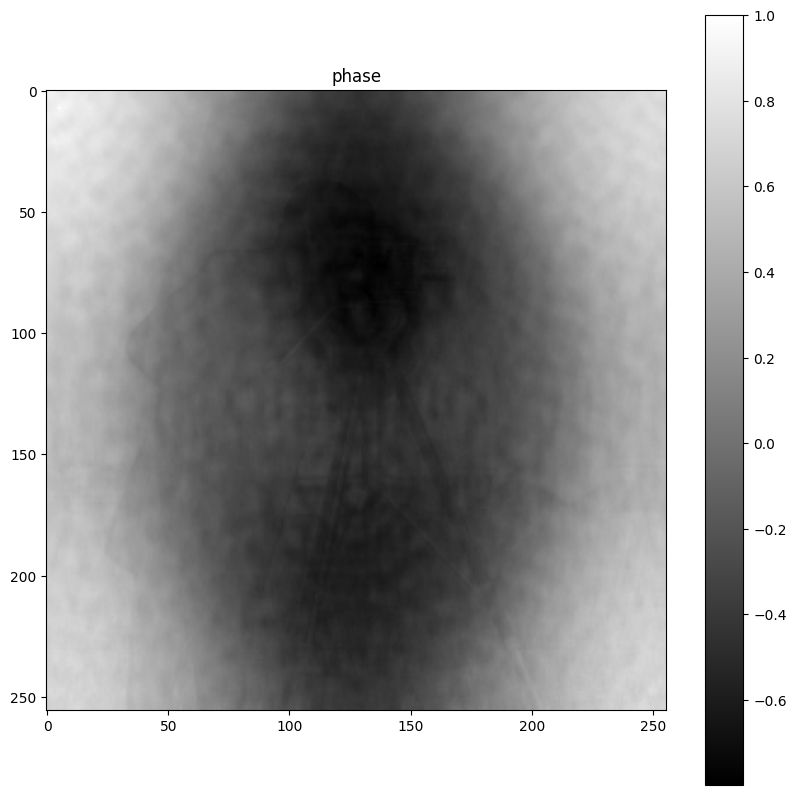

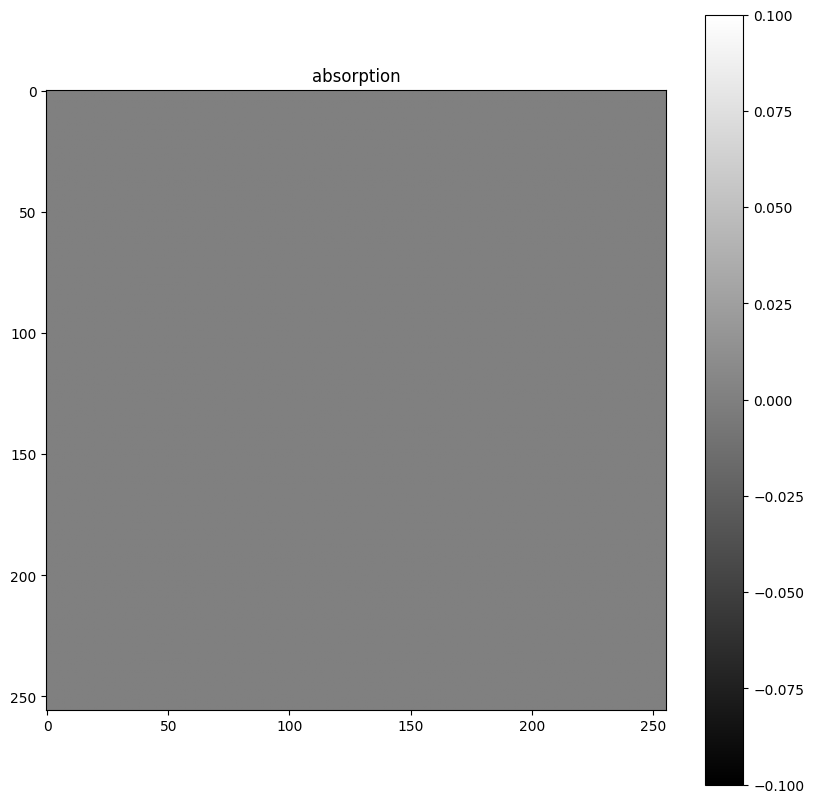

In [6]:
# from lib import plot_or_show_images
plot_or_show_images([propagated_image], show_or_plot='show', title='propagated', rows= 1, cols=1, figsize=(50,50))
plot_or_show_images([phase[0]], show_or_plot='show', title='phase', rows= 1, cols=1, figsize=(50,50))
plot_or_show_images([absorption[0]], show_or_plot='show', title='absorption', rows= 1, cols=1, figsize=(10,10))

# #save the images
# import os
# import dxchange
# save_wpath = 'data/gan_phase/cameraman/'
# #save the images
# if not os.path.exists(save_wpath):
#     os.makedirs(save_wpath)
#     os.makedirs(save_wpath+'/abs/')
#     os.makedirs(save_wpath+'/phase/')
#     os.makedirs(save_wpath+'/ground_truth/')

# # dxchange.write_tiff(absorption[0], save_wpath+'abs/abs{}'.format(1))
# # dxchange.write_tiff(phase[0], save_wpath+'phase/phase_{}'.format(1))
# # dxchange.write_tiff(cameraman_tes_image, save_wpath+'propagation/propagation{}'.format(1))
# # dxchange.write_tiff(cameraman_tes_image, save_wpath+'ground_truth/ground_phase{}'.format(1))

# #save as jpg
# from PIL import Image
# import numpy as np

# def save_as_jpg(image, save_path, image_name):
#     image = np.array(image)
#     image = image.astype(np.float32)
#     image = (image - np.min(image))/(np.max(image) - np.min(image))
#     image = image * 255
#     image = image.astype(np.uint8)
#     image = Image.fromarray(image)
#     image.save(save_path+image_name+'.jpg')

# save_as_jpg(absorption[0], save_wpath+'abs/', 'absorption')
# save_as_jpg(phase[0], save_wpath+'phase/', 'phase')
# save_as_jpg(cameraman_tes_image, save_wpath+'ground_truth/', 'ground_truth')
# save_as_jpg(propagated[0], save_wpath+'propagation/', 'propagation')


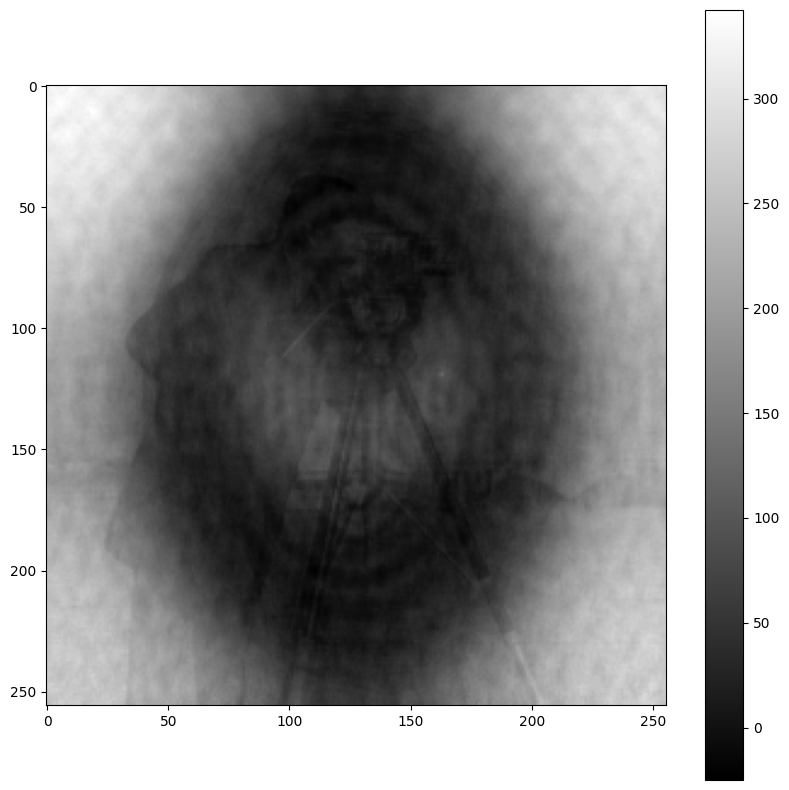

In [7]:
visualize([tf.reshape(tf.concat(side_propagation, axis=0)[:,:,:,0], [-1, px, py, 1])[800]])

In [9]:
import tensorflow as tf

output_file = 'output_file.mp4'
# Stack the images into a 4D tensor
stacked_images = tf.reshape(tf.concat(side_propagation, axis=0)[:,:,:,0], [-1, px, py, 1])
#make the image's bounded between 0 and 255
stacked_images = (stacked_images - tf.reduce_min(stacked_images))/(tf.reduce_max(stacked_images) - tf.reduce_min(stacked_images)) * 255

print(stacked_images.shape)
# Set the frame rate to 120 FPS
fps = 120
frame_interval = 1 / fps
# Create the video writer
writer = tf.io.TFRecordWriter(output_file)

# Write the images to the video file
for i in range(stacked_images.shape[0]):
    # Encode the image as a JPEG
    image_jpeg = tf.image.encode_jpeg(tf.cast(stacked_images[i], tf.uint8))
    mean = tf.reduce_mean(stacked_images[i])
    stddev = tf.math.reduce_std(stacked_images[i])
    # Create a video frame, while adding the mean and stddev to the frame
    video_frame = tf.train.SequenceExample(
        context=tf.train.Features(
            feature={
                'image/encoded': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_jpeg.numpy()])),
                'image/format': tf.train.Feature(bytes_list=tf.train.BytesList(value=[b'jpeg'])),
                'mean': tf.train.Feature(float_list=tf.train.FloatList(value=[mean])),
                'stddev': tf.train.Feature(float_list=tf.train.FloatList(value=[stddev]))
            }
        ),
        feature_lists=tf.train.FeatureLists(
            feature_list={
                'image/encoded': tf.train.FeatureList(feature=[
                    tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_jpeg.numpy()]))
                ])
            }
        )
    )
    writer.write(video_frame.SerializeToString())

    
    # Wait for the specified frame interval
    if i < stacked_images.shape[0] - 1:
        time.sleep(frame_interval)

#converting to mp4
import subprocess 
subprocess.run(['ffmpeg', '-i', 'output_file.mp4', '10000_phases.mp4'])

# Close the video writer
writer.close()


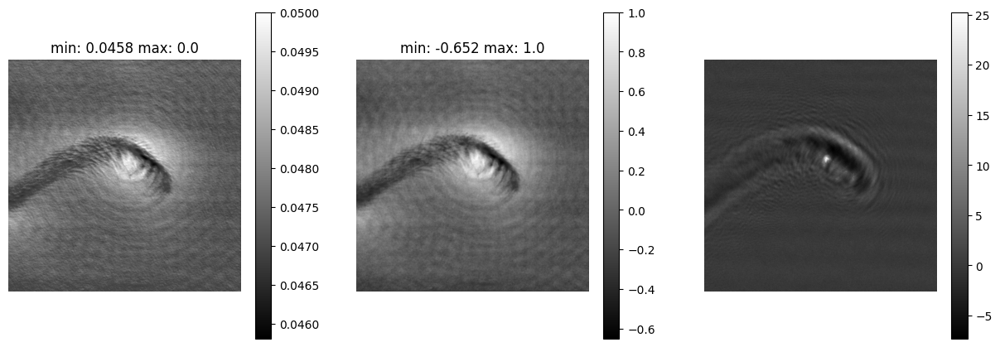

                                                                   0
experiment_name                                spider_hair_126_0.001
iter                                                             200
sum of pointwise difference                                 9.509039
sum of absolute value of pointwise difference              83.991127
sum of squared difference                                  87.941254
PSNR                                                     [7.6507726]
SSIM                                                    [0.59345907]
NRMSE                                                         9.3777
MSSIM                                                    [0.8408128]
epoch_time                                               [17.787012]
total_time                                                 17.787012


,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,0.2794,0.2795,0.2796,0.2797,0.2798,0.2799,0.2800,0.2801,0.2802,0
experiment_name,spider_hair_0_0.005,spider_hair_0_0.001,spider_hair_0_0.01,spider_hair_0_0.1,spider_hair_0_0.005,spider_hair_1_0.005,spider_hair_2_0.005,spider_hair_3_0.005,spider_hair_4_0.005,spider_hair_5_0.005,...,spider_hair_0_0.0,spider_hair_0_0.0,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_0_0.1,spider_hair_126_0.001
iter,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,500,500,500,1000,5000,5000,5000,5000,5000,200
sum of pointwise difference,1.0678117,1.0677754,1.0677476,1.0681081,1.0675116,1.7406926,5.294111,4.6951256,-2.0370803,-0.76821685,...,8.329749e-06,-2.6136637e-05,3.3289194e-05,-2.3841858e-05,-8.717179e-06,1.66744e-05,3.003329e-05,0.00013619661,-0.0005617142,9.509039
sum of absolute value of pointwise difference,27.055195,26.410727,19.84621,17.291338,17.791815,33.992867,31.49842,31.038956,31.634548,33.0773,...,16.67133,19.737286,21.44172,17.74835,9.501696,9.348601,10.596326,18.750647,31.55122,83.991127
sum of squared difference,5.6280355,5.884934,3.3873558,2.4756074,2.4831715,9.0479965,7.518339,7.4791965,8.405365,9.745775,...,2.7562149,3.2465556,3.7363863,3.9597592,1.715352,1.7274837,1.7330309,5.215781,8.871991,87.941254
PSNR,[19.58913],[19.395283],[21.794092],[23.155882],[23.142632],[17.527176],[18.331478],[18.354149],[17.847134],[17.204535],...,[19.679268],[18.96817],[18.35788],[18.105711],[21.738865],[21.70826],[21.694336],[16.909206],[14.602188],[7.6507726]
SSIM,[0.89393246],[0.842487],[0.93475425],[0.9483144],[0.93816346],[0.735249],[0.80681175],[0.85031],[0.8700472],[0.8572213],...,[0.87230545],[0.85909283],[0.83640707],[0.8532237],[0.91644937],[0.91739494],[0.90516376],[0.91607267],[0.8749572],[0.59345907]
NRMSE,2.372348,2.4258883,1.840477,1.5734063,1.5758082,3.0079887,2.7419589,2.734812,2.8992007,3.1218224,...,1.6601851,1.80182,1.9329734,1.9899144,1.3097146,1.3143377,1.3164463,2.2838085,2.9785888,9.3777
MSSIM,[0.98695135],[0.9543729],[0.9928939],[0.9946718],[0.99315494],[0.8924219],[0.9378776],[0.97340477],[0.97980803],[0.97619706],...,[0.9782627],[0.9790909],[0.97788954],[0.96519125],[0.9796399],[0.979799],[0.97715247],[0.98464566],[0.9716115],[0.8408128]
epoch_time,[77.765144],[61.675625],[57.26491],[61.144947],[80.770164],[80.770164],[80.770164],[80.770164],[80.770164],[80.770164],...,18.81668734550476,18.720871925354004,16.84722924232483,32.58435368537903,118.5828046798706,134.55280923843384,132.95291209220886,112.4302728176117,126.90874361991882,[17.787012]


In [10]:
energy = 11
z = 7.8880960e-2
pv = 1.04735263e-7
iter_num = 700

import dxchange
fname_data = 'data/gan_phase/data_spider.tif'
kwargs = {'energy': energy, 'z': z, 'pv': pv, 'iter_num': iter_num, 'phase_only': False, 'save_wpath': 'data/gan_phase/spider_abs_ratio/', 'init_wpath': 'data/gan_phase/spider_abs_ratio/', 'init_model': False}
data = dxchange.read_tiff(fname_data)
nprj, px,  py = data.shape
data = nor_phase(data)
abs_ratio = 0.01

abs_ratio_all = np.arange(0.01, 10*0.04, 0.004)
abs_ratio_all = 0.001*np.ones(1)

absorption = np.zeros(shape=(abs_ratio_all.shape[0], px, py), dtype=np.float32)
phase = np.zeros(shape=(abs_ratio_all.shape[0], px, py), dtype=np.float32)
propagated = np.zeros(shape=(abs_ratio_all.shape[0], px, py), dtype=np.float32)
loss = np.zeros(shape=(abs_ratio_all.shape[0], kwargs['iter_num']), dtype=np.float32)
time_count = np.zeros(shape=(abs_ratio_all.shape[0], 1), dtype=np.float32)

from ganrec_dataloader import measure_reconstruction_quality, tf_reshape, tfback_phase
kwargs = {}
kwargs['energy'] = energy
kwargs['z'] = z
kwargs['pv'] = pv
kwargs['phase_only'] = False
kwargs['recon_monitor'] = False
kwargs['iter_num'] = 200
kwargs['internal_iter'] = 2
kwargs['last_retrieval'] = False
kwargs['save_wpath'] = 'data/gan_phase/spider_abs_ratio/'
kwargs['init_wpath'] = 'data/gan_phase/spider_abs_ratio/'
kwargs['init_model'] = False
kwargs['save_model'] = False
kwargs['filter_type'] = 'median' #chose from median, contrast, noise, diffuse, phase_only, alternate
kwargs['output_num'] = 3
side_propagations = []


for i, abs_ratio in enumerate(abs_ratio_all):
    idx = i+ 126
    gan_phase_object = GANphase(data[idx], **kwargs)
    start = time.time()
    absorption[i], phase[i],propagated[i], loss[i], side_propagation  = gan_phase_object.recon
    side_propagations.append(side_propagation)
    end = time.time()
    time_count[i] = end - start
    # matched = tfback_phase( propagated[i], data[idx])
    visualize([absorption[i], phase[i], propagated[i]])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/phase/phase_'+str(idx)+'_'+str(abs_ratio)+'.tif', phase[i])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/abs/abs_'+str(idx)+'_'+str(abs_ratio)+'.tif', absorption[i])
    # io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/propagated/propagated_'+str(idx)+'_'+str(abs_ratio)+'.tif', propagated[i])
    df = measure_reconstruction_quality(img1=tf_reshape(propagated[i]), img2 = tf_reshape(data[idx]), experiment_name = 'spider_hair_'+str(idx)+'_'+str(abs_ratio), csv_file = 'Vojtech_fixed.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count[0], total_time = np.sum(time_count))
    display(df)

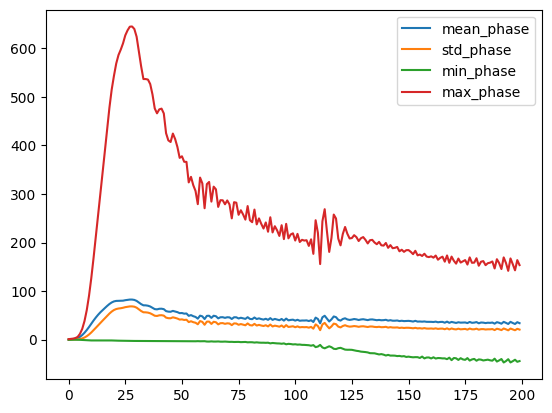

In [11]:
# visualize([side_propagations[0][0][0,:,:,0].numpy()])

#using pandas, analyze the mean, std, min, max of the side propagation
import pandas as pd
analysis = pd.DataFrame({'experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phasee', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'})
for i in range(len(side_propagations)):
    for iter in range(len(side_propagations[0])):
        #fill the values in the dataframe
        new_pd = pd.DataFrame(columns=['experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phase', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'])
        new_pd['experiment'] = [i]
        new_pd['iteration'] = [iter]
        new_pd['mean_phase'] = [np.mean(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['std_phase'] = [np.std(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['min_phase'] = [np.min(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['max_phase'] = [np.max(side_propagations[i][iter][0,:,:,0].numpy())]
        new_pd['mean_abs'] = [np.mean(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['std_abs'] = [np.std(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['min_abs'] = [np.min(side_propagations[i][iter][0,:,:,1].numpy())]
        new_pd['max_abs'] = [np.max(side_propagations[i][iter][0,:,:,1].numpy())]
        analysis = pd.concat([analysis, new_pd], axis=0)
analysis.drop(analysis.columns[0], axis=1, inplace=True)
analysis.dropna(inplace=True)
analysis.to_csv('data/gan_phase/spider_abs_ratio/analysis.csv')

#graph the mean, std, min, max of the side propagation
import matplotlib.pyplot as plt
plt.figure()
plt.plot(analysis['iteration'], analysis['mean_phase'], label='mean_phase')
plt.plot(analysis['iteration'], analysis['std_phase'], label='std_phase')
plt.plot(analysis['iteration'], analysis['min_phase'], label='min_phase')
plt.plot(analysis['iteration'], analysis['max_phase'], label='max_phase')
plt.legend()
plt.savefig('data/gan_phase/spider_abs_ratio/phase_analysis.png')


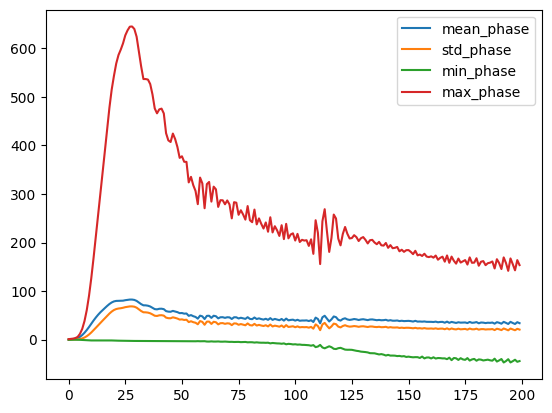

In [12]:
#graph the mean, std, min, max of the side propagation
import matplotlib.pyplot as plt
plt.figure()
plt.plot(analysis['iteration'], analysis['mean_phase'], label='mean_phase')
plt.plot(analysis['iteration'], analysis['std_phase'], label='std_phase')
plt.plot(analysis['iteration'], analysis['min_phase'], label='min_phase')
plt.plot(analysis['iteration'], analysis['max_phase'], label='max_phase')
plt.legend()
plt.savefig('data/gan_phase/spider_abs_ratio/phase_analysis.png')


sh: ffmpeg: command not found


32512

In [73]:
for_video = tf.concat(side_propagation, axis=0)[:,:,:,0].numpy()
# generate FFmpeg command to make a video from the sequence of images in for_video
fps = 30
command = f"ffmpeg -r {fps} -f image2 -s {px}x{py} -i for_video_%d.png -vcodec libx264 -crf 25  -pix_fmt yuv420p test.mp4"
os.system(command)
import ffmpeg
import cv2
images = for_video
height, width, layers = images.shape
size = (width,height)
out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
for i in range(len(images)):
    out.write(images[i])
out.release()




[mpeg4 @ 0x61c8c240] dimensions too large for MPEG-4
[ERROR:0@8707.319] global cap_ffmpeg_impl.hpp:3049 open Could not open codec mpeg4, error: Unspecified error (-22)
[ERROR:0@8707.319] global cap_ffmpeg_impl.hpp:3066 open VIDEOIO/FFMPEG: Failed to initialize VideoWriter
[ERROR:0@8707.395] global cap.cpp:595 open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.7.0) /io/opencv/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): project.avi in function 'icvExtractPattern'




In [ ]:
# visualize([side_propagations[0][50][0,:,:,0].numpy(), side_propagations[0][250][0,:,:,0].numpy(), side_propagations[0][400][0,:,:,0].numpy(), side_propagations[0][490][0,:,:,0].numpy()])
# visualize([side_propagations[0][50][0,:,:,1].numpy(), side_propagations[0][250][0,:,:,1].numpy(), side_propagations[0][400][0,:,:,1].numpy(), side_propagations[0][490][0,:,:,1].numpy()])
# visualize([side_propagations[0][50][0,:,:,2].numpy(), side_propagations[0][250][0,:,:,2].numpy(), side_propagations[0][400][0,:,:,2].numpy(), side_propagations[0][490][0,:,:,2].numpy()])

In [ ]:
# side_propagations[0][50:55][0].shape

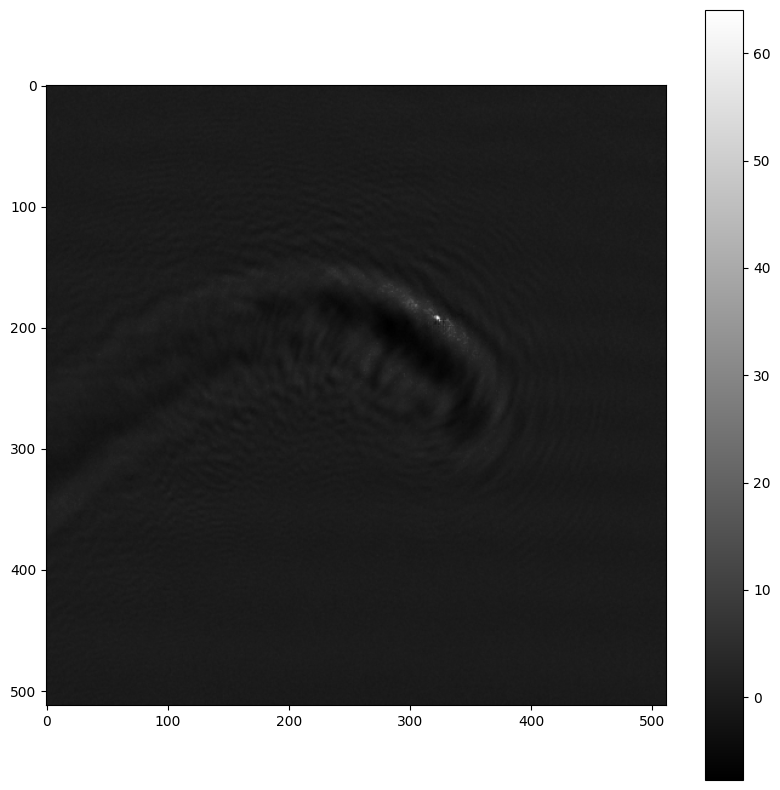

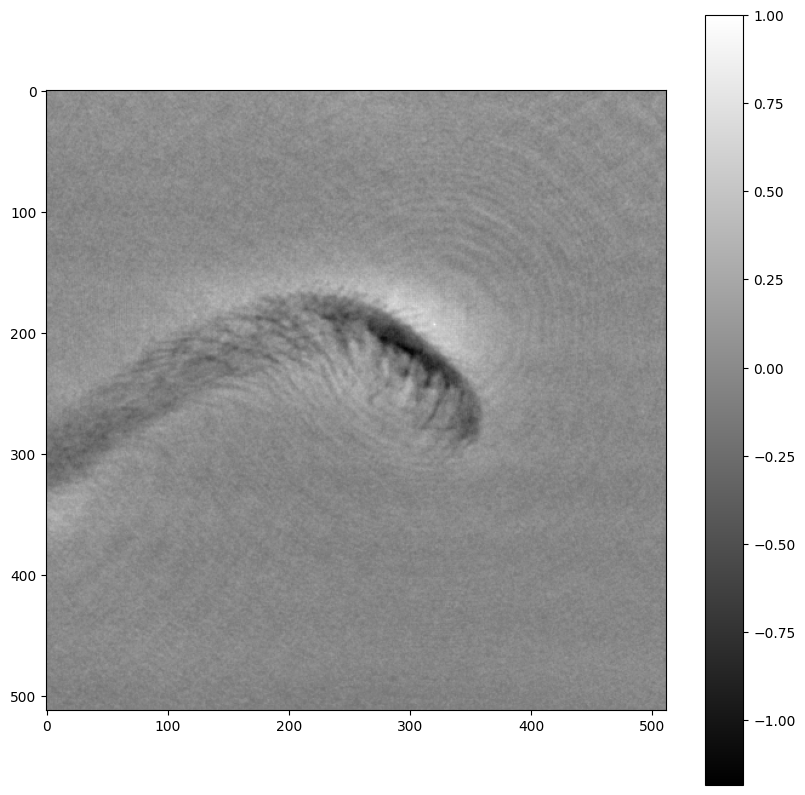

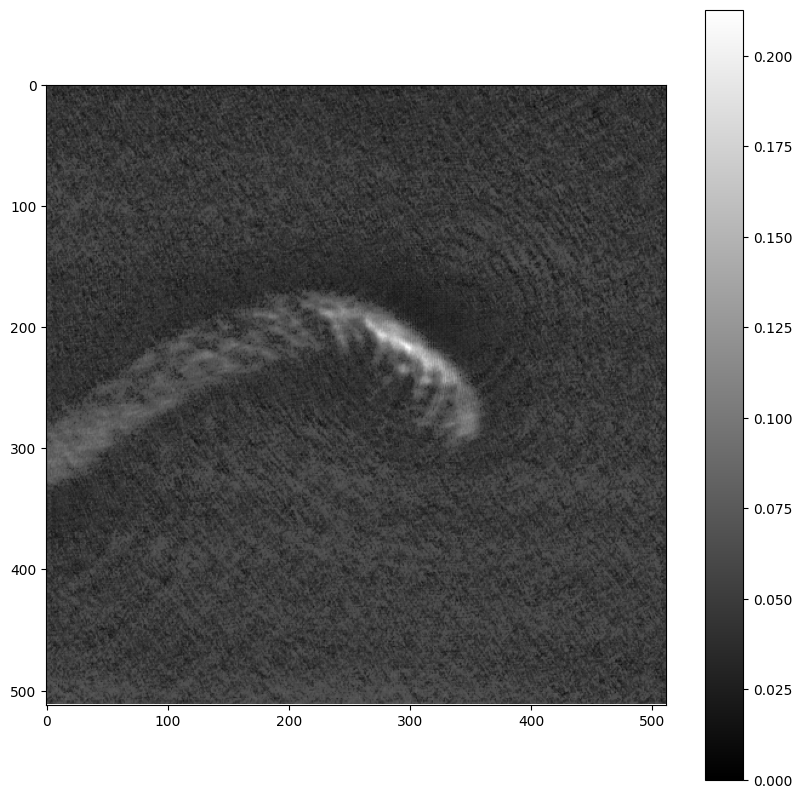

In [13]:
visualize(propagated)
visualize(phase)
visualize(absorption)

In [ ]:
visualize(propagated)
visualize(phase)
visualize(absorption)

In [15]:
visualize_interact(phase)
visualize_interact(absorption)

interactive(children=(Dropdown(description='Show or plot:', options=('show', 'plot'), value='show'), IntSlider…

interactive(children=(Dropdown(description='Show or plot:', options=('show', 'plot'), value='show'), IntSlider…

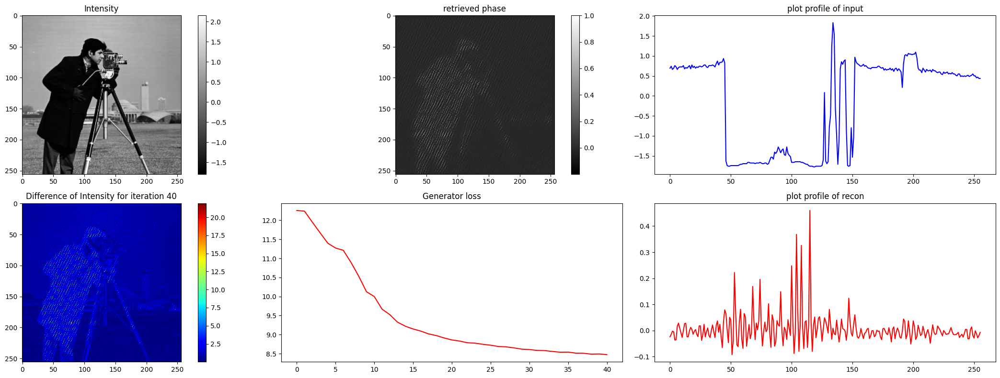

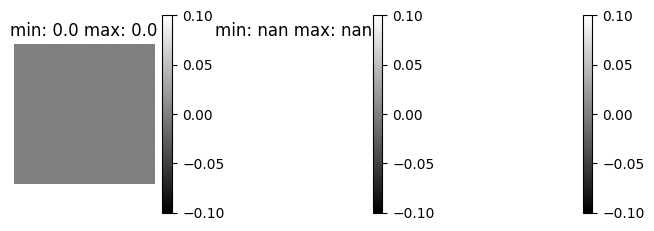

In [45]:
#Barbara data
cameraman_tes_image =nor_phase(dxchange.read_tiff('data/cameraman.tif'))
import quantities as pq
energy = 8.8 * pq.keV
lam = wavelength_from_energy(energy)
fresnel_nummber = 0.5 * pq.dimensionless
z = 1.0 * pq.meter
pv = np.sqrt(fresnel_nummber * lam * z) #array(8.39314161e-06) * m


kwargs['iter_num'] = 10000
kwargs['internal_iter'] = 3
kwargs['last_retrieval'] = False
kwargs['save_wpath'] = 'data/gan_phase/cameraman/'
kwargs['init_wpath'] = 'data/gan_phase/cameraman/'
kwargs['init_model'] = False
kwargs['save_model'] = False
kwargs['filter_type'] = 'median' #chose from median, contrast, noise, diffuse, phase_only, alternate
kwargs['output_num'] = 3
kwargs['energy'] = energy.magnitude
kwargs['z'] = z.magnitude
kwargs['pv'] = pv.magnitude
kwargs['phase_only'] = True
kwargs['recon_monitor'] = False
kwargs['abs_ratio'] = 0
kwargs['dropout'] = 0.25
kwargs['idx'] = 0

absorption, phase, propagated, loss, side_propagation = train(cameraman_tes_image, **kwargs)
visualize([absorption, phase, propagated])


In [ ]:
#